## Part 1: Network Training

### Step0: Import Package & Hyperparameter Configuration

In [1]:
%reset -f

import os
import torch
import numpy as np
import random
import torch.nn as nn
from torch.autograd import Variable
from torch.utils.data import DataLoader, TensorDataset
import matplotlib.pyplot as plt

In [2]:
# %%
# Unified Hyperparameter Configuration
class Config:
    SEED = 1
    NUM_EPOCHS = 3000
    BATCH_SIZE = 128
    LEARNING_RATE = 0.002  #論文提供
    LR_SCHEDULER_GAMMA = 0.99  #論文提供
    DECAY_EPOCH = 200
    DECAY_RATIO = 0.5
    EARLY_STOPPING_PATIENCE = 500
    HIDDEN_SIZE = 30
    OPERATOR_SIZE = 30


# Reproducibility
random.seed(Config.SEED)
np.random.seed(Config.SEED)
torch.manual_seed(Config.SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False


In [3]:
material = "Material C"

# 定義保存模型的路徑
model_save_dir = "./Model/"
os.makedirs(model_save_dir, exist_ok=True)  # 如果路徑不存在，創建路徑

# 定義模型保存檔名
model_save_path = os.path.join(model_save_dir, f"{material}.pt")

# Select device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

### Step1: Data processing and data loader generate 

In [4]:
# %% Preprocess data into a data loader
def get_dataloader(data_B, data_F, data_T, data_H, data_Pcv, norm, n_init=16):
    """ #*(Date:250105)
    Process data and return DataLoader for training, validation, and testing.

    Parameters
    ----------
    data_B : np.array
        Magnetic flux density data.
    data_F : np.array
        Frequency data.
    data_T : np.array
        Temperature data.
    data_H : np.array
        Magnetic field strength data.
    data_Pcv : np.array
        Core loss data.
    norm : list
        Normalization parameters for the features.
    n_init : int
        Number of initial data points for magnetization.

    Returns
    -------
    train_loader, valid_loader, test_loader : DataLoader
        Dataloaders for training, validation, and testing sets.
    """

    # Data pre-process
    # 1. Down-sample to 128 points
    seq_length = 128
    cols = range(0, 1024, int(1024 / seq_length))  #range(start, stop, step)
    data_B = data_B[:, cols]
    data_H = data_H[:, cols]  #*  Add H Down-sample to 128 points (Date:241213)

    # 2. Add extra points for initial magnetization calculation
    data_length = seq_length + n_init
    data_B = np.hstack((data_B, data_B[:, :n_init]))
    data_H = np.hstack(
        (data_H, data_H[:, :n_init]))  #*(Date:241216) MMINN output似乎是128點
    #*(Date:250130) 原始MMINN H有包含n_init

    # 3. Format data into tensors  #*(Date:241216) seq_length=128, data_length=144
    B = torch.from_numpy(data_B).view(-1, data_length, 1).float()
    H = torch.from_numpy(data_H).view(-1, data_length, 1).float()
    F = torch.log10(torch.from_numpy(data_F).view(-1, 1).float())
    T = torch.from_numpy(data_T).view(-1, 1).float()
    Pcv = torch.log10(torch.from_numpy(data_Pcv).view(-1, 1).float())

    # 4. Data Normalization
    in_B = (B - norm[0][0]) / norm[0][1]
    out_H = (H - norm[1][0]) / norm[1][1]
    in_T = (T - norm[3][0]) / norm[3][1]
    in_F = (F - norm[2][0]) / norm[2][1]
    in_Pcv = (Pcv - norm[5][0]) / norm[5][1]

    # 5. Extra features
    dB = torch.diff(B, dim=1)
    dB = torch.cat((dB[:, 0:1], dB), dim=1)
    dB_dt = dB * (seq_length * F.view(-1, 1, 1))

    in_dB = torch.diff(B, dim=1)
    in_dB = torch.cat((in_dB[:, 0:1], in_dB), dim=1)

    in_dB_dt = (dB_dt - norm[4][0]) / norm[4][1]

    max_B, _ = torch.max(in_B, dim=1)
    min_B, _ = torch.min(in_B, dim=1)

    s0 = get_operator_init(in_B[:, 0] - in_dB[:, 0], in_dB, max_B, min_B)

    # 6. Create dataloader to speed up data processing
    full_dataset = torch.utils.data.TensorDataset(
        torch.cat((in_B, in_dB, in_dB_dt), dim=2),  # B 部分（144 點）
        torch.cat((in_F, in_T, in_Pcv), dim=1),  # 輔助變量
        s0,  # 初始狀態
        out_H)

    # Split dataset into train, validation, and test sets (60:20:20)
    train_size = int(0.8 * len(full_dataset))
    valid_size = len(full_dataset) - train_size

    train_dataset, valid_dataset = torch.utils.data.random_split(
        full_dataset, [train_size, valid_size],
        generator=torch.Generator().manual_seed(Config.SEED))

    train_loader = torch.utils.data.DataLoader(train_dataset,
                                               batch_size=Config.BATCH_SIZE,
                                               shuffle=True,
                                               num_workers=0,
                                               collate_fn=filter_input)

    valid_loader = torch.utils.data.DataLoader(valid_dataset,
                                               batch_size=Config.BATCH_SIZE,
                                               shuffle=False,
                                               num_workers=0,
                                               collate_fn=filter_input)

    return train_loader, valid_loader


# %% Predict the operator state at t0
def get_operator_init(B1,
                      dB,
                      Bmax,
                      Bmin,
                      max_out_H=5,
                      operator_size=Config.OPERATOR_SIZE):
    """Compute the initial state of hysteresis operators"""
    s0 = torch.zeros((dB.shape[0], operator_size))
    operator_thre = torch.from_numpy(
        np.linspace(max_out_H / operator_size, max_out_H,
                    operator_size)).view(1, -1)

    for i in range(dB.shape[0]):
        for j in range(operator_size):
            r = operator_thre[0, j]
            if (Bmax[i] >= r) or (Bmin[i] <= -r):
                if dB[i, 0] >= 0:
                    if B1[i] > Bmin[i] + 2 * r:
                        s0[i, j] = r
                    else:
                        s0[i, j] = B1[i] - (r + Bmin[i])
                else:
                    if B1[i] < Bmax[i] - 2 * r:
                        s0[i, j] = -r
                    else:
                        s0[i, j] = B1[i] + (r - Bmax[i])
    return s0


def filter_input(batch):
    inputs, features, s0, target_H = zip(*batch)

    # 如果 inputs 是 tuple，先堆疊成張量
    inputs = torch.stack(inputs)  # B 的所有輸入部分（144 點）

    # 保留 in_B, in_dB, in_dB_dt 作為模型輸入
    inputs = inputs[:, :, :3]

    # 保留 features（包括 in_F 和 in_T）
    features = torch.stack(features)[:, :2]

    # 保留目標值 H
    target_H = torch.stack(target_H)[:, -128:, :]  # 只取最後 128 點

    s0 = torch.stack(s0)  # 初始狀態

    return inputs, features, s0, target_H


In [5]:
# %%
# Material normalization data (1.B 2.H 3.F 4.T 5.dB/dt 6.Pv)
normsDict = {
    "Material A": [[-4.02296069e-19, 6.42790612e-02],
                   [1.15118525e-01, 1.22041107e+01],
                   [5.16368866e+00, 2.68540382e-01],
                   [5.52569885e+01, 2.61055470e+01],
                   [2.42224485e-01, 2.37511802e+00],
                   [4.94751596e+00, 8.27844262e-01]],
    "Material B": [[6.75135623e-20, 6.27030179e-02],
                   [3.95575739e-02, 7.62486081e+00],
                   [5.26432657e+00, 2.88519919e-01],
                   [5.80945930e+01, 2.40673885e+01],
                   [2.72521585e-01, 2.46433449e+00],
                   [5.05083704e+00, 7.10303366e-01]],
    "Material C": [[-7.61633305e-19, 7.95720905e-02],
                   [1.11319124e-01, 1.30629103e+01],
                   [5.18559408e+00, 2.68714815e-01],
                   [5.84123573e+01, 2.40717468e+01],
                   [3.26634765e-01, 3.03949690e+00],
                   [4.74633312e+00, 8.05532336e-01]],
    "Material D": [[-3.82835526e-18, 8.10498434e-02],
                   [-1.14488902e-02, 2.83868927e+01],
                   [5.25141287e+00, 2.50821203e-01],
                   [6.72413788e+01, 2.59518223e+01],
                   [3.00584078e-01, 3.24369454e+00],
                   [5.01819372e+00, 8.41059685e-01]],
    "Material E": [[-4.22607249e-18, 1.28762770e-01],
                   [3.88389004e-01, 4.80431443e+01],
                   [5.18909550e+00, 2.77695119e-01],
                   [5.64505730e+01, 2.46127701e+01],
                   [6.35038793e-01, 5.19237566e+00],
                   [5.68955612e+00, 7.26979315e-01]]
}

### Step2: Define Network Structure

In [6]:
# %% Magnetization mechansim-determined neural network
"""
    Parameters:
    - hidden_size: number of eddy current slices (RNN neuron)
    - operator_size: number of operators
    - input_size: number of inputs (1.B 2.dB 3.dB/dt)
    - var_size: number of supplenmentary variables (1.F 2.T)        
    - output_size: number of outputs (1.H)
"""


class MMINet(nn.Module):

    def __init__(self,
                 Material,
                 hidden_size=Config.HIDDEN_SIZE,
                 operator_size=Config.OPERATOR_SIZE,
                 input_size=3,
                 var_size=2,
                 output_size=1):
        super().__init__()
        self.input_size = input_size
        self.var_size = var_size
        self.hidden_size = hidden_size
        self.output_size = output_size
        self.operator_size = operator_size
        self.norm = normsDict[Material]

        self.rnn1 = StopOperatorCell(self.operator_size)
        self.dnn1 = nn.Linear(self.operator_size + 2, 1)
        self.rnn2 = EddyCell(4, self.hidden_size, output_size)
        self.dnn2 = nn.Linear(self.hidden_size, 1)

        self.rnn2_hx = None

    def forward(self, x, var, s0, n_init=16):
        """
         Parameters: 
          - x(batch,seq,input_size): Input features (1.B, 2.dB, 3.dB/dt)  
          - var(batch,var_size): Supplementary inputs (1.F 2.T)
          - s0(batch,1): Operator inital states
        """
        batch_size = x.size(0)  # Batch size
        seq_size = x.size(1)  # Ser
        self.rnn1_hx = s0

        # Initialize DNN2 input (1.B 2.dB/dt)
        x2 = torch.cat((x[:, :, 0:1], x[:, :, 2:3]), dim=2)

        for t in range(seq_size):
            # RNN1 input (dB,state)
            self.rnn1_hx = self.rnn1(x[:, t, 1:2], self.rnn1_hx)

            # DNN1 input (rnn1_hx,F,T)
            dnn1_in = torch.cat((self.rnn1_hx, var), dim=1)

            # H hysteresis prediction
            H_hyst_pred = self.dnn1(dnn1_in)

            # DNN2 input (B,dB/dt,T,F)
            rnn2_in = torch.cat((x2[:, t, :], var), dim=1)

            # Initialize second rnn state
            if t == 0:
                H_eddy_init = x[:, t, 0:1] - H_hyst_pred
                buffer = x.new_ones(x.size(0), self.hidden_size)
                self.rnn2_hx = Variable(
                    (buffer / torch.sum(self.dnn2.weight, dim=1)) *
                    H_eddy_init)

            #rnn2_in = torch.cat((rnn2_in,H_hyst_pred),dim=1)
            self.rnn2_hx = self.rnn2(rnn2_in, self.rnn2_hx)

            # H eddy prediction
            H_eddy = self.dnn2(self.rnn2_hx)

            # H total
            H_total = (H_hyst_pred + H_eddy).view(batch_size, 1,
                                                  self.output_size)
            if t == 0:
                output = H_total
            else:
                output = torch.cat((output, H_total), dim=1)

        H = (output[:, n_init:, :])

        return H


class StopOperatorCell():

    def __init__(self, operator_size):
        self.operator_thre = torch.from_numpy(
            np.linspace(5 / operator_size, 5, operator_size)).view(1, -1)

    def sslu(self, X):
        a = torch.ones_like(X)
        return torch.max(-a, torch.min(a, X))

    def __call__(self, dB, state):
        r = self.operator_thre.to(dB.device)
        output = self.sslu((dB + state) / r) * r
        return output.float()


class EddyCell(nn.Module):

    def __init__(self, input_size, hidden_size, output_size=1):
        super().__init__()
        self.input_size = input_size
        self.hidden_size = hidden_size
        self.output_size = output_size

        self.x2h = nn.Linear(input_size, hidden_size, bias=False)
        self.h2h = nn.Linear(hidden_size, hidden_size, bias=False)

    def forward(self, x, hidden=None):
        hidden = self.x2h(x) + self.h2h(hidden)
        hidden = torch.sigmoid(hidden)
        return hidden

### Step3: Training the Model

In [7]:
# %%
def load_dataset(material, base_path="./Data/Training/"):
    in_file1 = f"{base_path}{material}/B_Field.csv"
    in_file2 = f"{base_path}{material}/Frequency.csv"
    in_file3 = f"{base_path}{material}/Temperature.csv"
    in_file4 = f"{base_path}{material}/H_Field.csv"
    in_file5 = f"{base_path}{material}/Volumetric_Loss.csv"

    data_B = np.genfromtxt(in_file1, delimiter=',')  # N by 1024
    data_F = np.genfromtxt(in_file2, delimiter=',')  # N by 1
    data_T = np.genfromtxt(in_file3, delimiter=',')  # N by 1
    data_H = np.genfromtxt(in_file4, delimiter=',')  # N by 1024
    data_Pcv = np.genfromtxt(in_file5, delimiter=',')  # N by 1

    return data_B, data_F, data_T, data_H, data_Pcv


In [8]:
# %%
def train_model(train_loader, valid_loader):

    model = MMINet(Material=material).to(device)
    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=Config.LEARNING_RATE)

    best_val_loss = float('inf')
    patience_counter = 0

    # 定義保存路徑
    model_save_path = os.path.join("./Model/", f"{material}.pt")

    for epoch in range(Config.NUM_EPOCHS):
        model.train()
        train_loss = 0

        for inputs, features, s0, target_H in train_loader:
            inputs, features, s0, target_H = inputs.to(device), features.to(
                device), s0.to(device), target_H.to(device)

            optimizer.zero_grad()
            outputs = model(inputs, features, s0)  # 模型的輸出
            loss = criterion(outputs, target_H)  # 使用真實的 H(t) 計算損失
            loss.backward()
            optimizer.step()
            train_loss += loss.item()

        train_loss /= len(train_loader)

        model.eval()
        val_loss = 0

        with torch.no_grad():
            for inputs, features, s0, target_H in valid_loader:
                inputs, features, s0, target_H = inputs.to(
                    device), features.to(device), s0.to(device), target_H.to(
                        device)
                outputs = model(inputs, features, s0)
                loss = criterion(outputs, target_H)
                val_loss += loss.item()

        val_loss /= len(valid_loader)

        print(
            f"Epoch {epoch+1}, Train Loss: {train_loss:.6f}, Validation Loss: {val_loss:.6f}"
        )
        # *======================================================Debug用======================================================
        plot_interval = 50
        if (epoch + 1) % plot_interval == 0:
            outputs = outputs[:3].detach().cpu().numpy()
            targets = target_H[:3].detach().cpu().numpy()

            # 設定圖表
            plt.figure(figsize=(12, 6))

            for i in range(outputs.shape[0]):  # 每一批數據繪製一個圖表
                plt.plot(outputs[i, :, 0],
                         label=f"Pred: Sample {i+1}",
                         linestyle='--',
                         marker='o')
                plt.plot(targets[i, :, 0],
                         label=f"Target: Sample {i+1}",
                         linestyle='-',
                         marker='x')

            # 添加標題和標籤
            plt.title(f"Compare - Epoch {epoch + 1}", fontsize=16)
            plt.xlabel("Index", fontsize=14)
            plt.ylabel("Value", fontsize=14)
            plt.legend(loc="upper right", fontsize=12)
            plt.grid(alpha=0.5)

            # 顯示圖表
            plt.show()
        # *======================================================Debug用 END ======================================================

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            torch.save(model.state_dict(), model_save_path)  # 保存最佳模型
            print(
                f"Saving model at epoch {epoch+1} with validation loss {val_loss:.6f}..."
            )
            patience_counter = 0
        else:
            patience_counter += 1

        if patience_counter >= Config.EARLY_STOPPING_PATIENCE:
            print("Early stopping triggered.")
            break

    print(f"Training complete. Best model saved at {model_save_path}.")


In [9]:
# 驗證輸入shape
# net = MMINet(Material=material).to(device)
# for inputs, features, s0 in train_loader:
#     print(f"inputs shape: {inputs.shape}")  # 包括 in_B, in_dB, in_dB_dt
#     print(f"features shape: {features.shape}")  # 包括 in_F, in_T
#     print(f"s0 shape: {s0.shape}")  # 初始化狀態向量
#     break

# 驗證輸出shape
# net = MMINet(Material=material).to(device)
# for inputs, features, s0 in train_loader:
#     # 提取輸入數據
#     inputs = inputs.to(device)  # in_B, in_dB, in_dB_dt
#     features = features.to(device)  # in_F, in_T
#     s0 = s0.to(device)  # 初始狀態向量

#     # 將數據傳入模型
#     outputs = net(inputs, features, s0)

#     # 打印輸出形狀與樣本數據
#     print(f"outputs shape: {outputs.shape}")
#     print(f"outputs data: {outputs[0]}")  # 打印第一個樣本的輸出波形數據
#     break


Epoch 1, Train Loss: 0.772758, Validation Loss: 0.533185
Saving model at epoch 1 with validation loss 0.533185...
Epoch 2, Train Loss: 0.307725, Validation Loss: 0.111893
Saving model at epoch 2 with validation loss 0.111893...
Epoch 3, Train Loss: 0.085282, Validation Loss: 0.068373
Saving model at epoch 3 with validation loss 0.068373...
Epoch 4, Train Loss: 0.059641, Validation Loss: 0.051656
Saving model at epoch 4 with validation loss 0.051656...
Epoch 5, Train Loss: 0.048025, Validation Loss: 0.043187
Saving model at epoch 5 with validation loss 0.043187...
Epoch 6, Train Loss: 0.041734, Validation Loss: 0.038242
Saving model at epoch 6 with validation loss 0.038242...
Epoch 7, Train Loss: 0.037582, Validation Loss: 0.035054
Saving model at epoch 7 with validation loss 0.035054...
Epoch 8, Train Loss: 0.034895, Validation Loss: 0.032612
Saving model at epoch 8 with validation loss 0.032612...
Epoch 9, Train Loss: 0.032957, Validation Loss: 0.030712
Saving model at epoch 9 with va

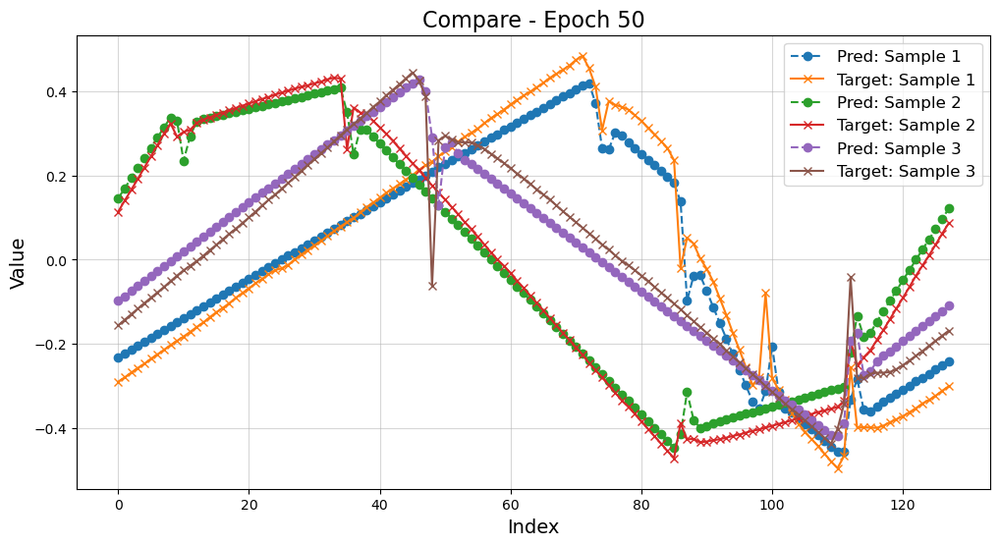

Saving model at epoch 50 with validation loss 0.017126...
Epoch 51, Train Loss: 0.018020, Validation Loss: 0.016987
Saving model at epoch 51 with validation loss 0.016987...
Epoch 52, Train Loss: 0.017927, Validation Loss: 0.016751
Saving model at epoch 52 with validation loss 0.016751...
Epoch 53, Train Loss: 0.017833, Validation Loss: 0.016524
Saving model at epoch 53 with validation loss 0.016524...
Epoch 54, Train Loss: 0.017480, Validation Loss: 0.016423
Saving model at epoch 54 with validation loss 0.016423...
Epoch 55, Train Loss: 0.017524, Validation Loss: 0.016526
Epoch 56, Train Loss: 0.017172, Validation Loss: 0.016188
Saving model at epoch 56 with validation loss 0.016188...
Epoch 57, Train Loss: 0.017041, Validation Loss: 0.016045
Saving model at epoch 57 with validation loss 0.016045...
Epoch 58, Train Loss: 0.016845, Validation Loss: 0.015867
Saving model at epoch 58 with validation loss 0.015867...
Epoch 59, Train Loss: 0.016795, Validation Loss: 0.015907
Epoch 60, Trai

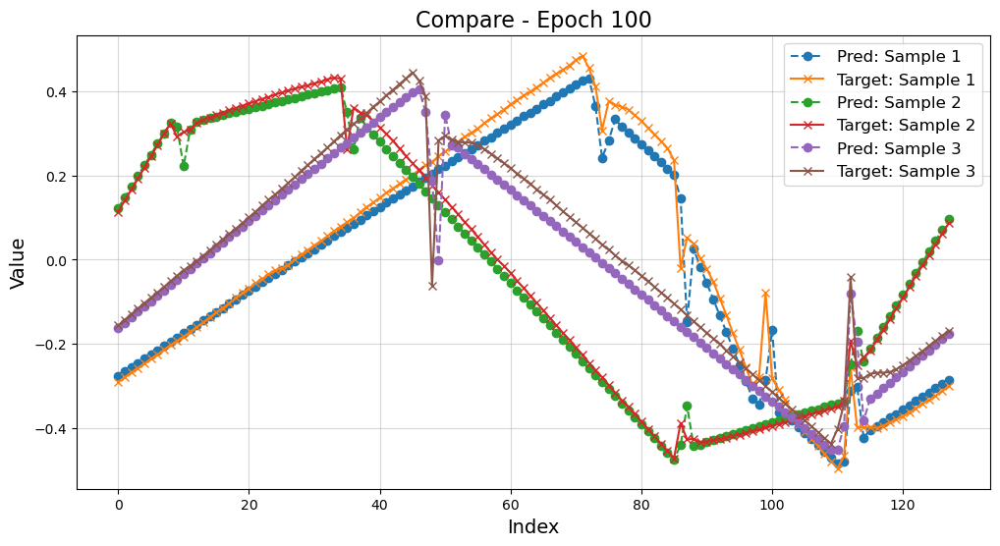

Epoch 101, Train Loss: 0.012836, Validation Loss: 0.012142
Saving model at epoch 101 with validation loss 0.012142...
Epoch 102, Train Loss: 0.012833, Validation Loss: 0.012217
Epoch 103, Train Loss: 0.012815, Validation Loss: 0.012358
Epoch 104, Train Loss: 0.012761, Validation Loss: 0.012132
Saving model at epoch 104 with validation loss 0.012132...
Epoch 105, Train Loss: 0.012736, Validation Loss: 0.011976
Saving model at epoch 105 with validation loss 0.011976...
Epoch 106, Train Loss: 0.012584, Validation Loss: 0.012049
Epoch 107, Train Loss: 0.012560, Validation Loss: 0.012033
Epoch 108, Train Loss: 0.012611, Validation Loss: 0.011949
Saving model at epoch 108 with validation loss 0.011949...
Epoch 109, Train Loss: 0.012415, Validation Loss: 0.011782
Saving model at epoch 109 with validation loss 0.011782...
Epoch 110, Train Loss: 0.012403, Validation Loss: 0.011744
Saving model at epoch 110 with validation loss 0.011744...
Epoch 111, Train Loss: 0.012381, Validation Loss: 0.0116

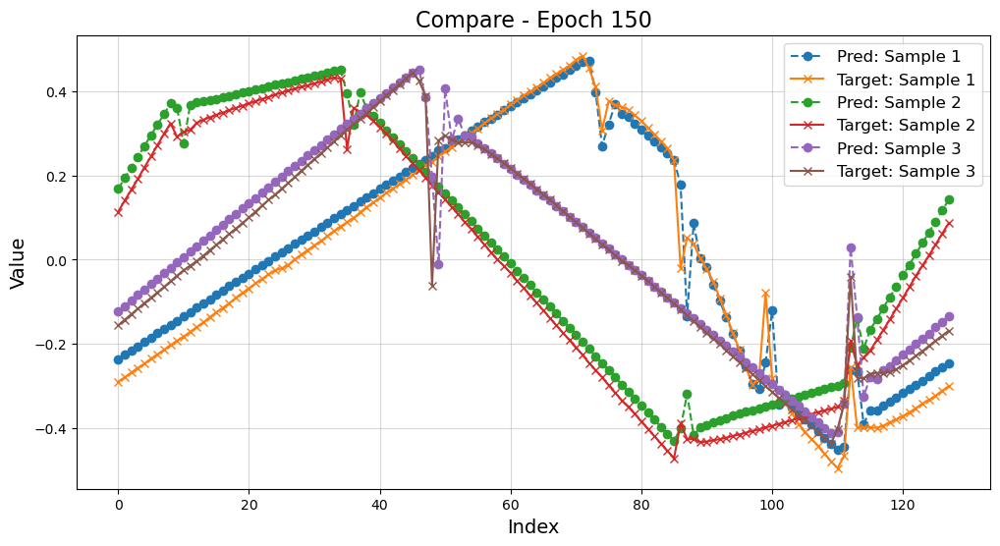

Epoch 151, Train Loss: 0.011318, Validation Loss: 0.011007
Epoch 152, Train Loss: 0.011285, Validation Loss: 0.010713
Saving model at epoch 152 with validation loss 0.010713...
Epoch 153, Train Loss: 0.011428, Validation Loss: 0.010911
Epoch 154, Train Loss: 0.011254, Validation Loss: 0.010652
Saving model at epoch 154 with validation loss 0.010652...
Epoch 155, Train Loss: 0.011290, Validation Loss: 0.010985
Epoch 156, Train Loss: 0.011138, Validation Loss: 0.010673
Epoch 157, Train Loss: 0.011236, Validation Loss: 0.010800
Epoch 158, Train Loss: 0.011327, Validation Loss: 0.010702
Epoch 159, Train Loss: 0.011120, Validation Loss: 0.010742
Epoch 160, Train Loss: 0.011113, Validation Loss: 0.010609
Saving model at epoch 160 with validation loss 0.010609...
Epoch 161, Train Loss: 0.011104, Validation Loss: 0.010595
Saving model at epoch 161 with validation loss 0.010595...
Epoch 162, Train Loss: 0.011191, Validation Loss: 0.010636
Epoch 163, Train Loss: 0.011102, Validation Loss: 0.0105

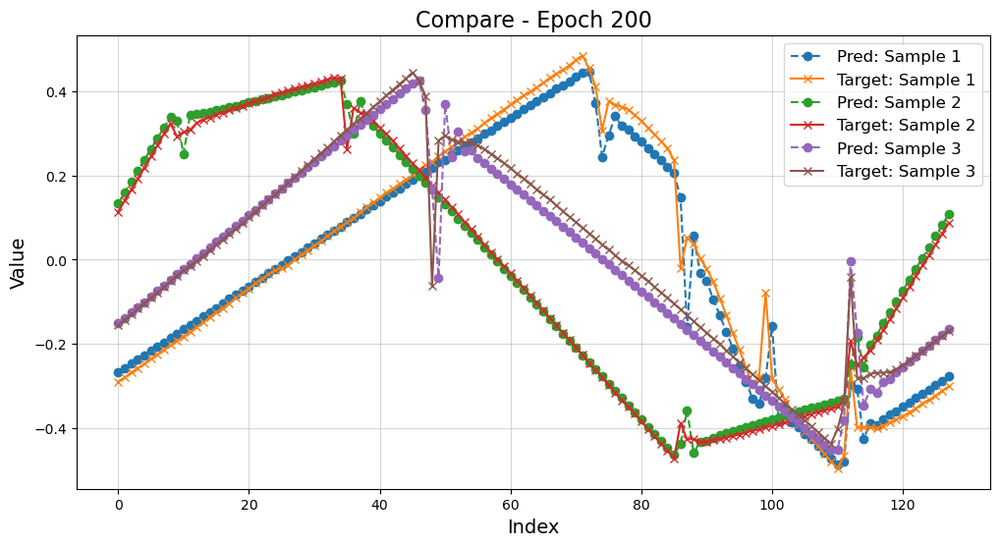

Saving model at epoch 200 with validation loss 0.010097...
Epoch 201, Train Loss: 0.010554, Validation Loss: 0.010080
Saving model at epoch 201 with validation loss 0.010080...
Epoch 202, Train Loss: 0.010527, Validation Loss: 0.010111
Epoch 203, Train Loss: 0.010615, Validation Loss: 0.010069
Saving model at epoch 203 with validation loss 0.010069...
Epoch 204, Train Loss: 0.010665, Validation Loss: 0.010499
Epoch 205, Train Loss: 0.010705, Validation Loss: 0.010051
Saving model at epoch 205 with validation loss 0.010051...
Epoch 206, Train Loss: 0.010560, Validation Loss: 0.010687
Epoch 207, Train Loss: 0.010532, Validation Loss: 0.010005
Saving model at epoch 207 with validation loss 0.010005...
Epoch 208, Train Loss: 0.010581, Validation Loss: 0.009994
Saving model at epoch 208 with validation loss 0.009994...
Epoch 209, Train Loss: 0.010477, Validation Loss: 0.010019
Epoch 210, Train Loss: 0.010416, Validation Loss: 0.009984
Saving model at epoch 210 with validation loss 0.009984.

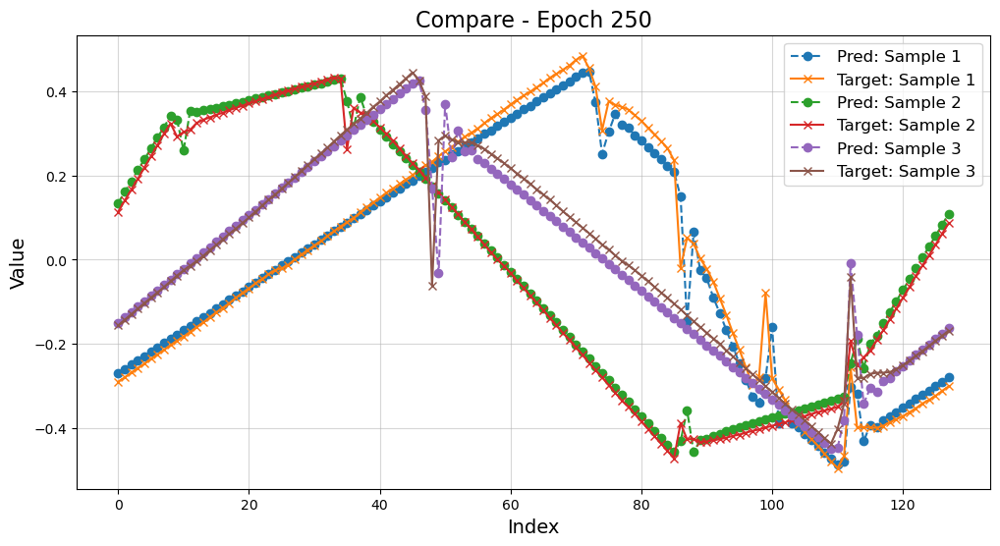

Epoch 251, Train Loss: 0.010147, Validation Loss: 0.009668
Epoch 252, Train Loss: 0.010050, Validation Loss: 0.009612
Saving model at epoch 252 with validation loss 0.009612...
Epoch 253, Train Loss: 0.010062, Validation Loss: 0.009611
Saving model at epoch 253 with validation loss 0.009611...
Epoch 254, Train Loss: 0.010070, Validation Loss: 0.009580
Saving model at epoch 254 with validation loss 0.009580...
Epoch 255, Train Loss: 0.010101, Validation Loss: 0.009743
Epoch 256, Train Loss: 0.010167, Validation Loss: 0.009749
Epoch 257, Train Loss: 0.010120, Validation Loss: 0.009927
Epoch 258, Train Loss: 0.010091, Validation Loss: 0.009637
Epoch 259, Train Loss: 0.010059, Validation Loss: 0.009657
Epoch 260, Train Loss: 0.010093, Validation Loss: 0.009688
Epoch 261, Train Loss: 0.010237, Validation Loss: 0.009649
Epoch 262, Train Loss: 0.010073, Validation Loss: 0.009815
Epoch 263, Train Loss: 0.010143, Validation Loss: 0.009572
Saving model at epoch 263 with validation loss 0.009572.

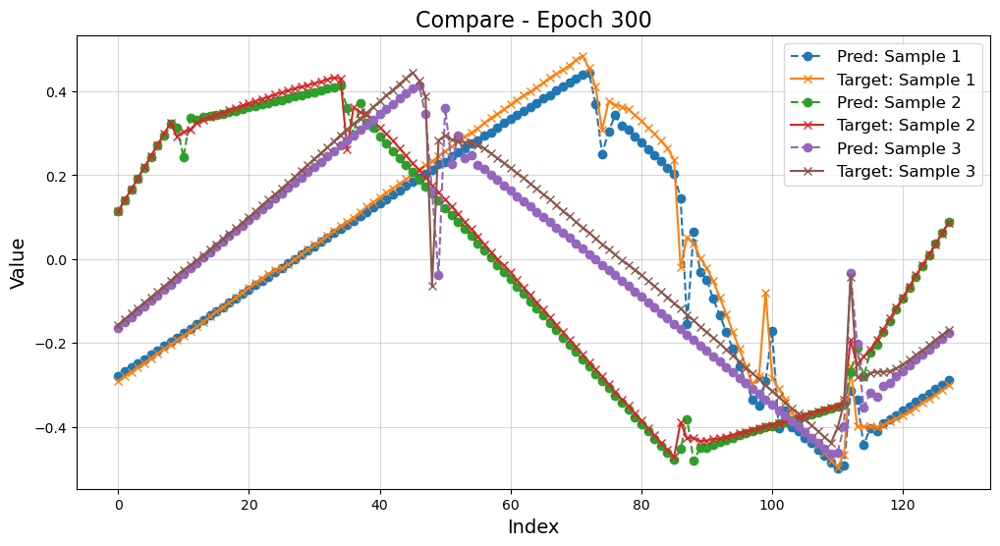

Epoch 301, Train Loss: 0.009867, Validation Loss: 0.009665
Epoch 302, Train Loss: 0.009828, Validation Loss: 0.009289
Epoch 303, Train Loss: 0.009812, Validation Loss: 0.009404
Epoch 304, Train Loss: 0.009722, Validation Loss: 0.009284
Epoch 305, Train Loss: 0.009684, Validation Loss: 0.009446
Epoch 306, Train Loss: 0.009748, Validation Loss: 0.009253
Saving model at epoch 306 with validation loss 0.009253...
Epoch 307, Train Loss: 0.009625, Validation Loss: 0.009341
Epoch 308, Train Loss: 0.009656, Validation Loss: 0.009327
Epoch 309, Train Loss: 0.009746, Validation Loss: 0.009212
Saving model at epoch 309 with validation loss 0.009212...
Epoch 310, Train Loss: 0.009634, Validation Loss: 0.009261
Epoch 311, Train Loss: 0.009638, Validation Loss: 0.009292
Epoch 312, Train Loss: 0.009671, Validation Loss: 0.009230
Epoch 313, Train Loss: 0.009655, Validation Loss: 0.009403
Epoch 314, Train Loss: 0.009664, Validation Loss: 0.009577
Epoch 315, Train Loss: 0.009710, Validation Loss: 0.0091

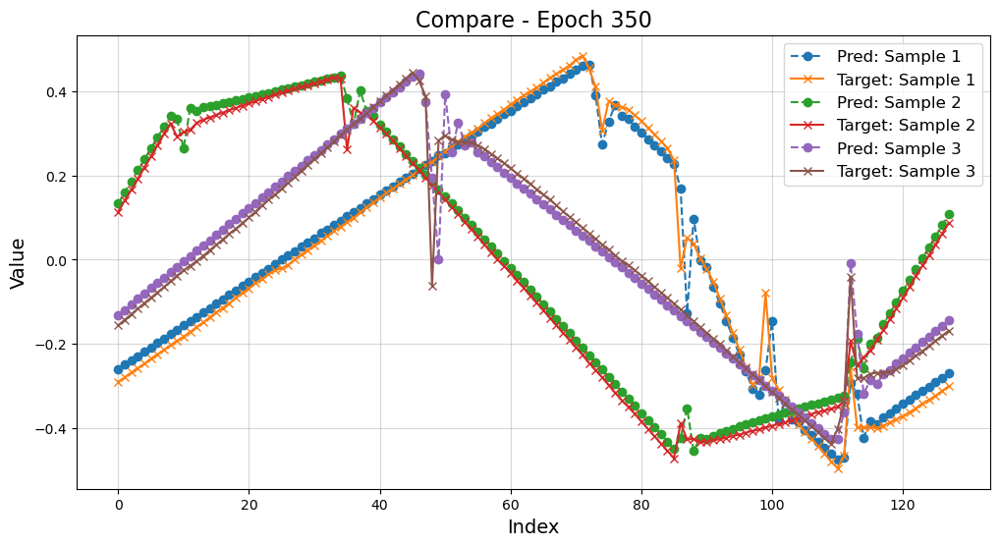

Epoch 351, Train Loss: 0.009585, Validation Loss: 0.009366
Epoch 352, Train Loss: 0.009385, Validation Loss: 0.008897
Saving model at epoch 352 with validation loss 0.008897...
Epoch 353, Train Loss: 0.009325, Validation Loss: 0.009078
Epoch 354, Train Loss: 0.009391, Validation Loss: 0.008958
Epoch 355, Train Loss: 0.009339, Validation Loss: 0.008925
Epoch 356, Train Loss: 0.009458, Validation Loss: 0.009037
Epoch 357, Train Loss: 0.009398, Validation Loss: 0.008931
Epoch 358, Train Loss: 0.009293, Validation Loss: 0.008936
Epoch 359, Train Loss: 0.009381, Validation Loss: 0.009195
Epoch 360, Train Loss: 0.009368, Validation Loss: 0.008904
Epoch 361, Train Loss: 0.009262, Validation Loss: 0.008876
Saving model at epoch 361 with validation loss 0.008876...
Epoch 362, Train Loss: 0.009412, Validation Loss: 0.009178
Epoch 363, Train Loss: 0.009295, Validation Loss: 0.008856
Saving model at epoch 363 with validation loss 0.008856...
Epoch 364, Train Loss: 0.009266, Validation Loss: 0.0090

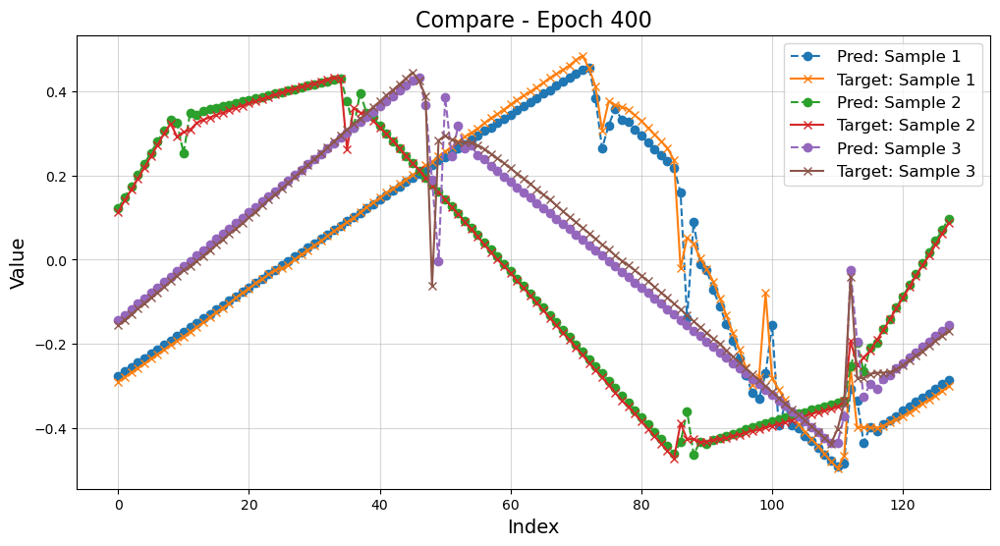

Saving model at epoch 400 with validation loss 0.008553...
Epoch 401, Train Loss: 0.009008, Validation Loss: 0.008683
Epoch 402, Train Loss: 0.009008, Validation Loss: 0.009159
Epoch 403, Train Loss: 0.009165, Validation Loss: 0.008697
Epoch 404, Train Loss: 0.009065, Validation Loss: 0.008816
Epoch 405, Train Loss: 0.008996, Validation Loss: 0.008532
Saving model at epoch 405 with validation loss 0.008532...
Epoch 406, Train Loss: 0.008906, Validation Loss: 0.008645
Epoch 407, Train Loss: 0.008975, Validation Loss: 0.008558
Epoch 408, Train Loss: 0.008962, Validation Loss: 0.009057
Epoch 409, Train Loss: 0.009040, Validation Loss: 0.008531
Saving model at epoch 409 with validation loss 0.008531...
Epoch 410, Train Loss: 0.008905, Validation Loss: 0.008592
Epoch 411, Train Loss: 0.008997, Validation Loss: 0.008815
Epoch 412, Train Loss: 0.008991, Validation Loss: 0.008669
Epoch 413, Train Loss: 0.008845, Validation Loss: 0.008499
Saving model at epoch 413 with validation loss 0.008499.

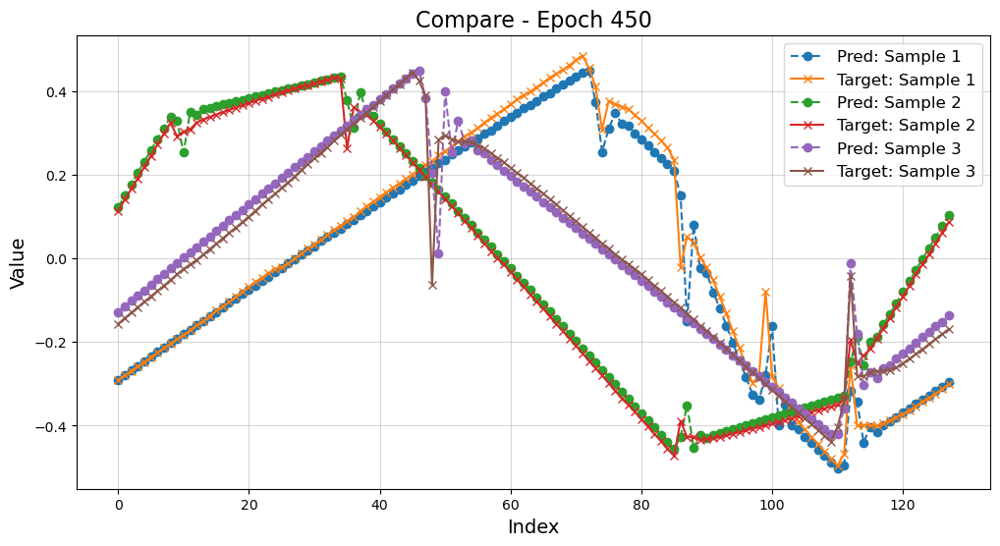

Saving model at epoch 450 with validation loss 0.008252...
Epoch 451, Train Loss: 0.008647, Validation Loss: 0.008260
Epoch 452, Train Loss: 0.008718, Validation Loss: 0.008590
Epoch 453, Train Loss: 0.008664, Validation Loss: 0.008756
Epoch 454, Train Loss: 0.008611, Validation Loss: 0.008217
Saving model at epoch 454 with validation loss 0.008217...
Epoch 455, Train Loss: 0.008575, Validation Loss: 0.008228
Epoch 456, Train Loss: 0.008669, Validation Loss: 0.008136
Saving model at epoch 456 with validation loss 0.008136...
Epoch 457, Train Loss: 0.008560, Validation Loss: 0.008329
Epoch 458, Train Loss: 0.008574, Validation Loss: 0.008283
Epoch 459, Train Loss: 0.008570, Validation Loss: 0.008554
Epoch 460, Train Loss: 0.008670, Validation Loss: 0.008262
Epoch 461, Train Loss: 0.008527, Validation Loss: 0.008372
Epoch 462, Train Loss: 0.008667, Validation Loss: 0.008160
Epoch 463, Train Loss: 0.008645, Validation Loss: 0.008619
Epoch 464, Train Loss: 0.008890, Validation Loss: 0.0082

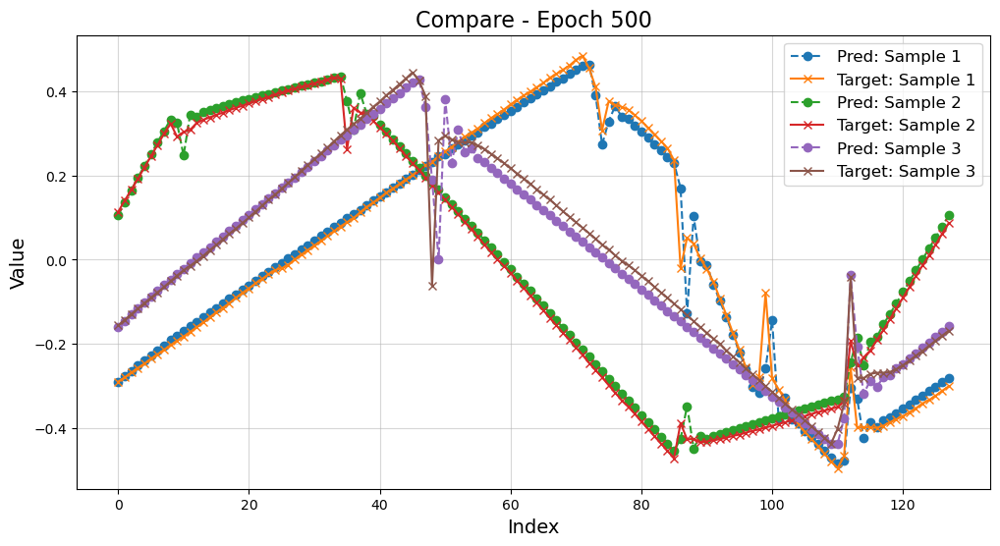

Epoch 501, Train Loss: 0.008255, Validation Loss: 0.007943
Epoch 502, Train Loss: 0.008311, Validation Loss: 0.008128
Epoch 503, Train Loss: 0.008722, Validation Loss: 0.007823
Epoch 504, Train Loss: 0.008222, Validation Loss: 0.007782
Saving model at epoch 504 with validation loss 0.007782...
Epoch 505, Train Loss: 0.008179, Validation Loss: 0.007756
Saving model at epoch 505 with validation loss 0.007756...
Epoch 506, Train Loss: 0.008186, Validation Loss: 0.008082
Epoch 507, Train Loss: 0.008365, Validation Loss: 0.007775
Epoch 508, Train Loss: 0.008268, Validation Loss: 0.007891
Epoch 509, Train Loss: 0.008213, Validation Loss: 0.007806
Epoch 510, Train Loss: 0.008123, Validation Loss: 0.007746
Saving model at epoch 510 with validation loss 0.007746...
Epoch 511, Train Loss: 0.008208, Validation Loss: 0.007815
Epoch 512, Train Loss: 0.008141, Validation Loss: 0.007880
Epoch 513, Train Loss: 0.008186, Validation Loss: 0.007854
Epoch 514, Train Loss: 0.008234, Validation Loss: 0.0079

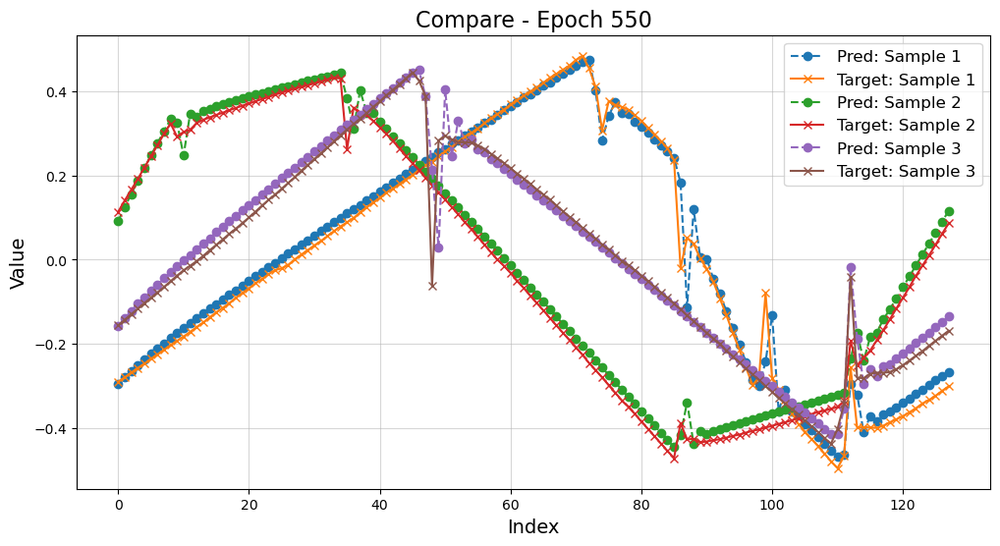

Epoch 551, Train Loss: 0.008098, Validation Loss: 0.007743
Epoch 552, Train Loss: 0.008017, Validation Loss: 0.008070
Epoch 553, Train Loss: 0.008190, Validation Loss: 0.007532
Epoch 554, Train Loss: 0.008002, Validation Loss: 0.007426
Saving model at epoch 554 with validation loss 0.007426...
Epoch 555, Train Loss: 0.007833, Validation Loss: 0.007480
Epoch 556, Train Loss: 0.007889, Validation Loss: 0.007526
Epoch 557, Train Loss: 0.007942, Validation Loss: 0.007543
Epoch 558, Train Loss: 0.007930, Validation Loss: 0.007465
Epoch 559, Train Loss: 0.007884, Validation Loss: 0.007454
Epoch 560, Train Loss: 0.007884, Validation Loss: 0.007777
Epoch 561, Train Loss: 0.007918, Validation Loss: 0.007411
Saving model at epoch 561 with validation loss 0.007411...
Epoch 562, Train Loss: 0.007989, Validation Loss: 0.007429
Epoch 563, Train Loss: 0.008035, Validation Loss: 0.007410
Saving model at epoch 563 with validation loss 0.007410...
Epoch 564, Train Loss: 0.007925, Validation Loss: 0.0080

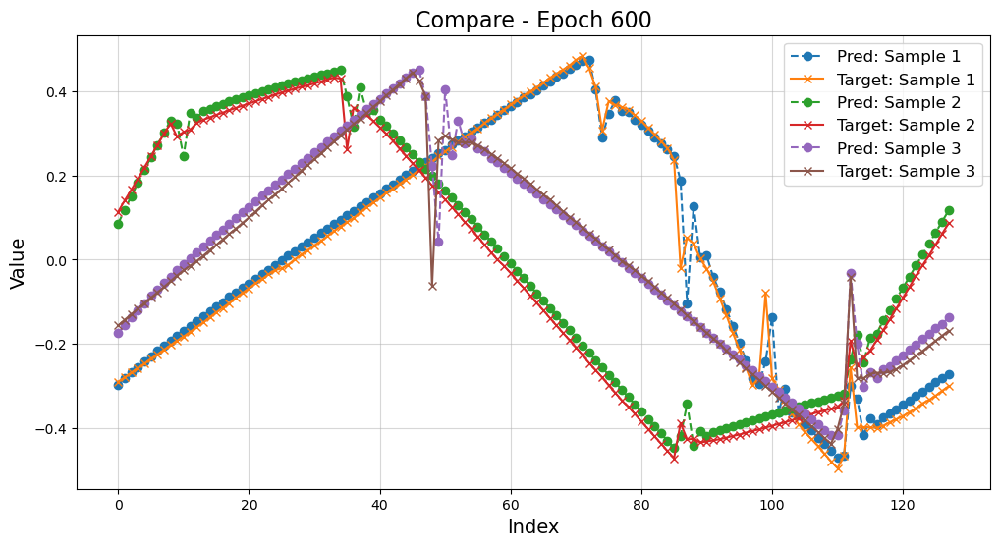

Epoch 601, Train Loss: 0.007691, Validation Loss: 0.007295
Epoch 602, Train Loss: 0.007631, Validation Loss: 0.007288
Epoch 603, Train Loss: 0.007699, Validation Loss: 0.007311
Epoch 604, Train Loss: 0.007725, Validation Loss: 0.007382
Epoch 605, Train Loss: 0.007616, Validation Loss: 0.007308
Epoch 606, Train Loss: 0.007693, Validation Loss: 0.007610
Epoch 607, Train Loss: 0.007690, Validation Loss: 0.007177
Saving model at epoch 607 with validation loss 0.007177...
Epoch 608, Train Loss: 0.007667, Validation Loss: 0.007214
Epoch 609, Train Loss: 0.007520, Validation Loss: 0.007091
Saving model at epoch 609 with validation loss 0.007091...
Epoch 610, Train Loss: 0.007719, Validation Loss: 0.007285
Epoch 611, Train Loss: 0.007552, Validation Loss: 0.007186
Epoch 612, Train Loss: 0.007608, Validation Loss: 0.007186
Epoch 613, Train Loss: 0.007598, Validation Loss: 0.007327
Epoch 614, Train Loss: 0.007428, Validation Loss: 0.007103
Epoch 615, Train Loss: 0.007423, Validation Loss: 0.0070

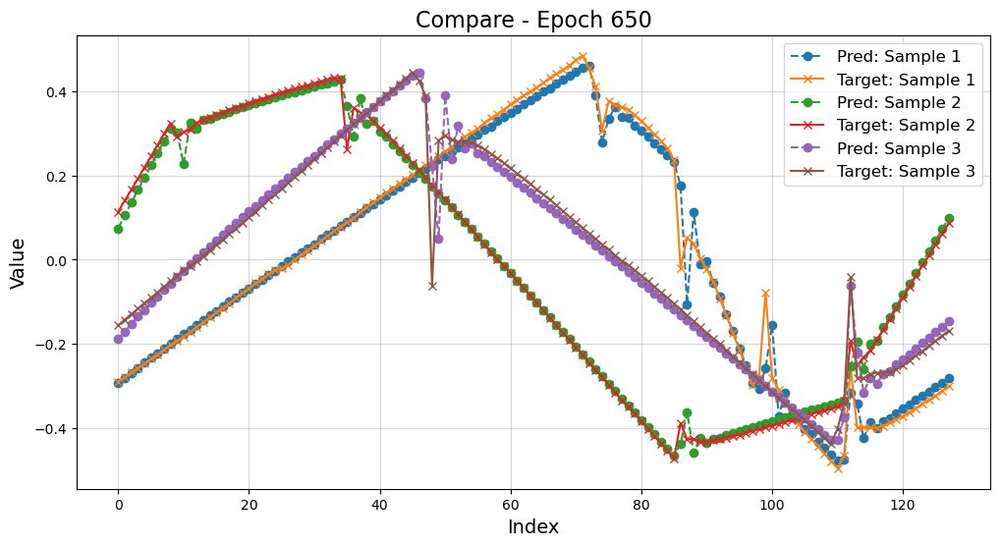

Saving model at epoch 650 with validation loss 0.006912...
Epoch 651, Train Loss: 0.007316, Validation Loss: 0.007033
Epoch 652, Train Loss: 0.007341, Validation Loss: 0.006890
Saving model at epoch 652 with validation loss 0.006890...
Epoch 653, Train Loss: 0.007295, Validation Loss: 0.006834
Saving model at epoch 653 with validation loss 0.006834...
Epoch 654, Train Loss: 0.007296, Validation Loss: 0.007163
Epoch 655, Train Loss: 0.007419, Validation Loss: 0.007895
Epoch 656, Train Loss: 0.007409, Validation Loss: 0.007721
Epoch 657, Train Loss: 0.007555, Validation Loss: 0.008015
Epoch 658, Train Loss: 0.007426, Validation Loss: 0.006854
Epoch 659, Train Loss: 0.007231, Validation Loss: 0.006930
Epoch 660, Train Loss: 0.007217, Validation Loss: 0.006845
Epoch 661, Train Loss: 0.007245, Validation Loss: 0.007398
Epoch 662, Train Loss: 0.007274, Validation Loss: 0.006929
Epoch 663, Train Loss: 0.007173, Validation Loss: 0.007214
Epoch 664, Train Loss: 0.007289, Validation Loss: 0.0073

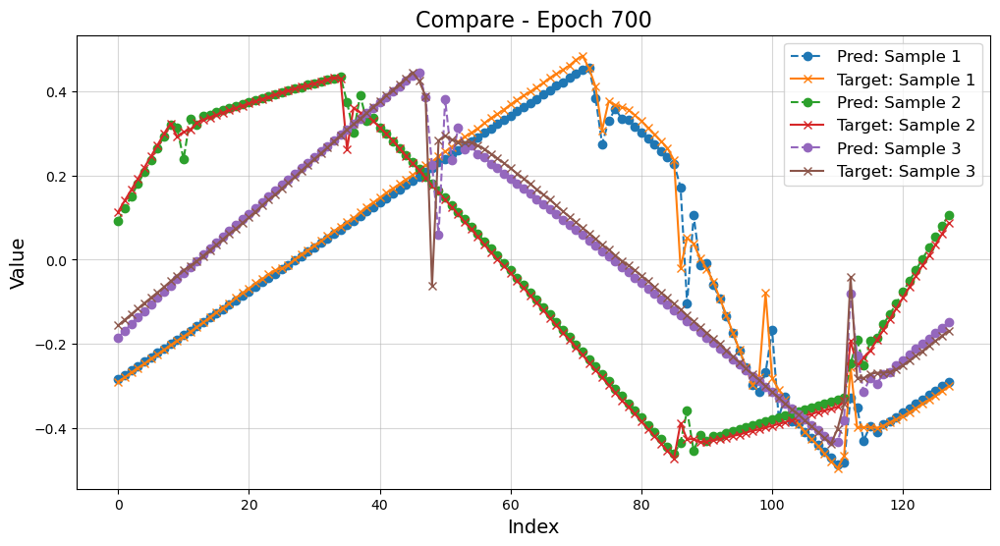

Saving model at epoch 700 with validation loss 0.006619...
Epoch 701, Train Loss: 0.006959, Validation Loss: 0.006849
Epoch 702, Train Loss: 0.007037, Validation Loss: 0.006719
Epoch 703, Train Loss: 0.007059, Validation Loss: 0.006723
Epoch 704, Train Loss: 0.007052, Validation Loss: 0.007034
Epoch 705, Train Loss: 0.007090, Validation Loss: 0.006686
Epoch 706, Train Loss: 0.006928, Validation Loss: 0.006637
Epoch 707, Train Loss: 0.007013, Validation Loss: 0.006906
Epoch 708, Train Loss: 0.006999, Validation Loss: 0.006585
Saving model at epoch 708 with validation loss 0.006585...
Epoch 709, Train Loss: 0.007033, Validation Loss: 0.006625
Epoch 710, Train Loss: 0.006946, Validation Loss: 0.006674
Epoch 711, Train Loss: 0.007047, Validation Loss: 0.006881
Epoch 712, Train Loss: 0.007052, Validation Loss: 0.006699
Epoch 713, Train Loss: 0.006964, Validation Loss: 0.006644
Epoch 714, Train Loss: 0.007051, Validation Loss: 0.006836
Epoch 715, Train Loss: 0.007249, Validation Loss: 0.0066

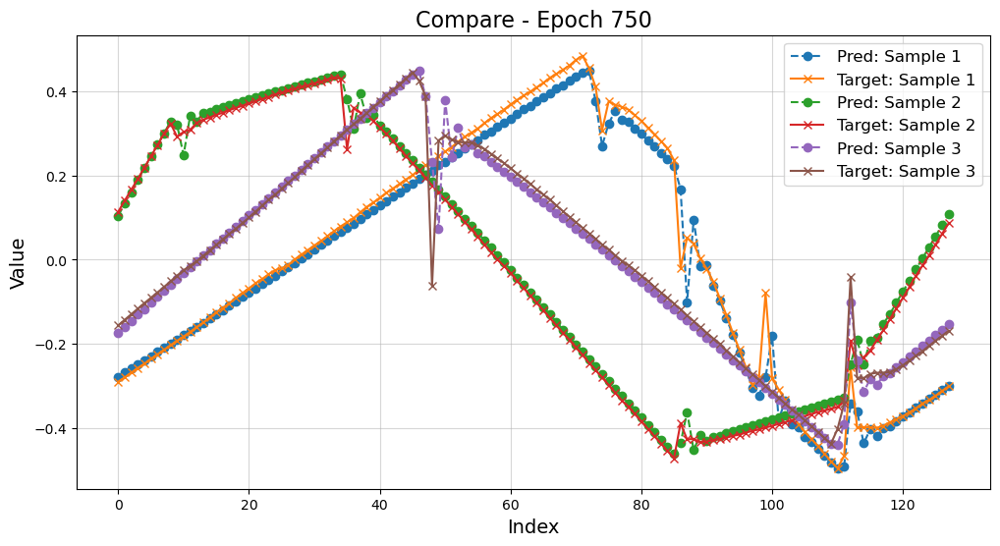

Epoch 751, Train Loss: 0.006933, Validation Loss: 0.006589
Epoch 752, Train Loss: 0.006714, Validation Loss: 0.006618
Epoch 753, Train Loss: 0.006779, Validation Loss: 0.006449
Epoch 754, Train Loss: 0.007038, Validation Loss: 0.006774
Epoch 755, Train Loss: 0.006853, Validation Loss: 0.006494
Epoch 756, Train Loss: 0.006841, Validation Loss: 0.006384
Saving model at epoch 756 with validation loss 0.006384...
Epoch 757, Train Loss: 0.006735, Validation Loss: 0.006423
Epoch 758, Train Loss: 0.006834, Validation Loss: 0.006411
Epoch 759, Train Loss: 0.006894, Validation Loss: 0.007324
Epoch 760, Train Loss: 0.006927, Validation Loss: 0.006417
Epoch 761, Train Loss: 0.006863, Validation Loss: 0.006364
Saving model at epoch 761 with validation loss 0.006364...
Epoch 762, Train Loss: 0.006682, Validation Loss: 0.006454
Epoch 763, Train Loss: 0.006755, Validation Loss: 0.006369
Epoch 764, Train Loss: 0.006855, Validation Loss: 0.006555
Epoch 765, Train Loss: 0.006689, Validation Loss: 0.0063

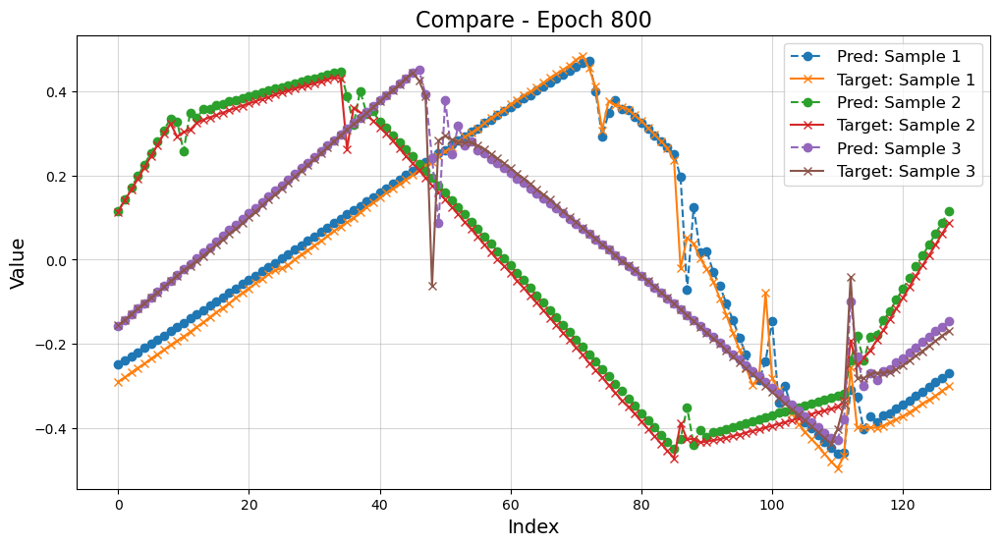

Epoch 801, Train Loss: 0.006755, Validation Loss: 0.006325
Epoch 802, Train Loss: 0.006579, Validation Loss: 0.006322
Epoch 803, Train Loss: 0.006579, Validation Loss: 0.006227
Saving model at epoch 803 with validation loss 0.006227...
Epoch 804, Train Loss: 0.006510, Validation Loss: 0.006242
Epoch 805, Train Loss: 0.006676, Validation Loss: 0.007041
Epoch 806, Train Loss: 0.006673, Validation Loss: 0.006178
Saving model at epoch 806 with validation loss 0.006178...
Epoch 807, Train Loss: 0.006638, Validation Loss: 0.006210
Epoch 808, Train Loss: 0.006698, Validation Loss: 0.006197
Epoch 809, Train Loss: 0.006534, Validation Loss: 0.006193
Epoch 810, Train Loss: 0.006461, Validation Loss: 0.006228
Epoch 811, Train Loss: 0.006640, Validation Loss: 0.006283
Epoch 812, Train Loss: 0.006878, Validation Loss: 0.006222
Epoch 813, Train Loss: 0.006549, Validation Loss: 0.006294
Epoch 814, Train Loss: 0.006520, Validation Loss: 0.006167
Saving model at epoch 814 with validation loss 0.006167.

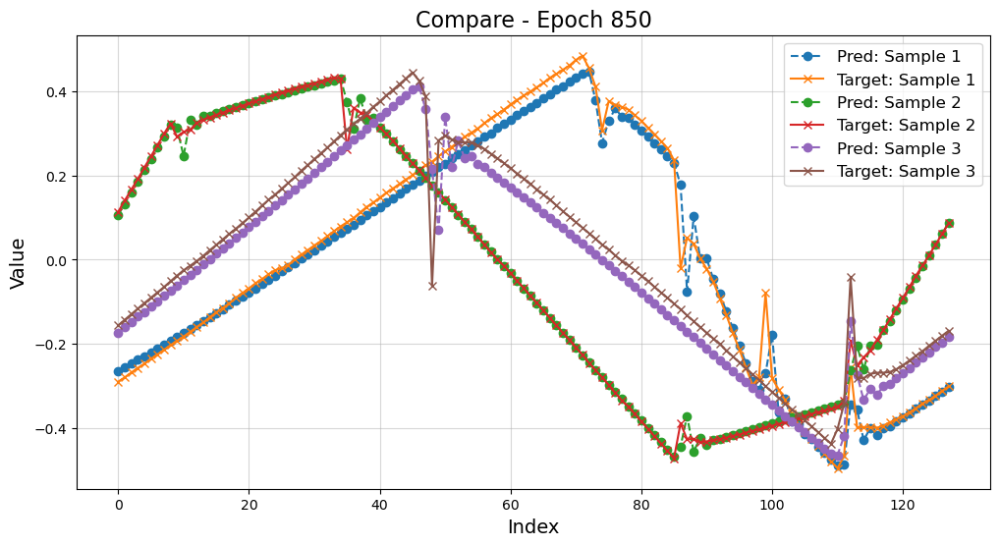

Epoch 851, Train Loss: 0.006435, Validation Loss: 0.006082
Epoch 852, Train Loss: 0.006456, Validation Loss: 0.006496
Epoch 853, Train Loss: 0.006626, Validation Loss: 0.006121
Epoch 854, Train Loss: 0.006445, Validation Loss: 0.006247
Epoch 855, Train Loss: 0.006441, Validation Loss: 0.006331
Epoch 856, Train Loss: 0.006436, Validation Loss: 0.006047
Saving model at epoch 856 with validation loss 0.006047...
Epoch 857, Train Loss: 0.006408, Validation Loss: 0.006193
Epoch 858, Train Loss: 0.006397, Validation Loss: 0.006096
Epoch 859, Train Loss: 0.006476, Validation Loss: 0.006196
Epoch 860, Train Loss: 0.006475, Validation Loss: 0.006050
Epoch 861, Train Loss: 0.006372, Validation Loss: 0.006174
Epoch 862, Train Loss: 0.006488, Validation Loss: 0.006128
Epoch 863, Train Loss: 0.006455, Validation Loss: 0.006069
Epoch 864, Train Loss: 0.006430, Validation Loss: 0.006294
Epoch 865, Train Loss: 0.006509, Validation Loss: 0.006061
Epoch 866, Train Loss: 0.006402, Validation Loss: 0.0061

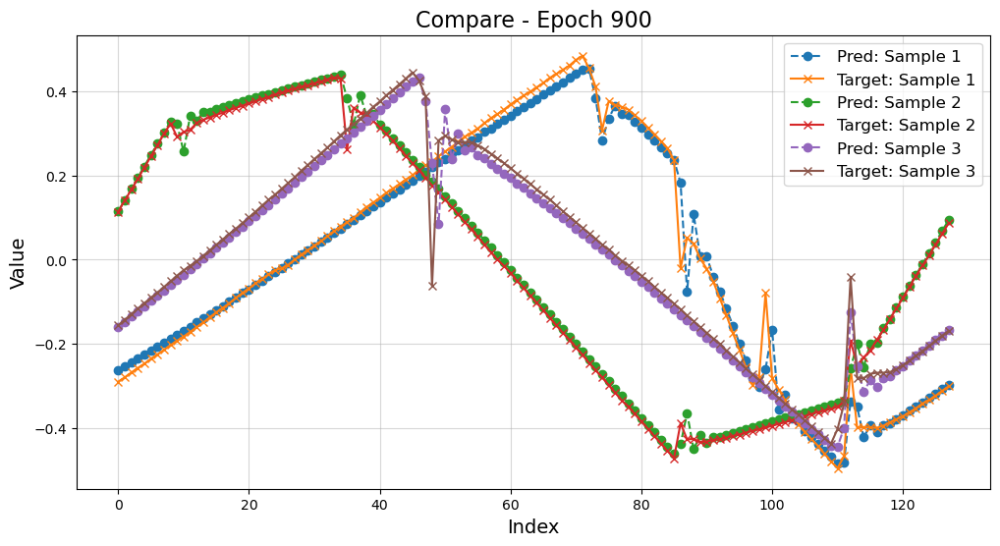

Saving model at epoch 900 with validation loss 0.005936...
Epoch 901, Train Loss: 0.006323, Validation Loss: 0.006080
Epoch 902, Train Loss: 0.006304, Validation Loss: 0.006082
Epoch 903, Train Loss: 0.006297, Validation Loss: 0.005958
Epoch 904, Train Loss: 0.006256, Validation Loss: 0.005940
Epoch 905, Train Loss: 0.006347, Validation Loss: 0.006155
Epoch 906, Train Loss: 0.006316, Validation Loss: 0.005949
Epoch 907, Train Loss: 0.006258, Validation Loss: 0.005960
Epoch 908, Train Loss: 0.006267, Validation Loss: 0.005964
Epoch 909, Train Loss: 0.006359, Validation Loss: 0.006157
Epoch 910, Train Loss: 0.006404, Validation Loss: 0.006081
Epoch 911, Train Loss: 0.006484, Validation Loss: 0.006286
Epoch 912, Train Loss: 0.006314, Validation Loss: 0.006072
Epoch 913, Train Loss: 0.006314, Validation Loss: 0.006154
Epoch 914, Train Loss: 0.006334, Validation Loss: 0.006131
Epoch 915, Train Loss: 0.006319, Validation Loss: 0.006022
Epoch 916, Train Loss: 0.006208, Validation Loss: 0.0060

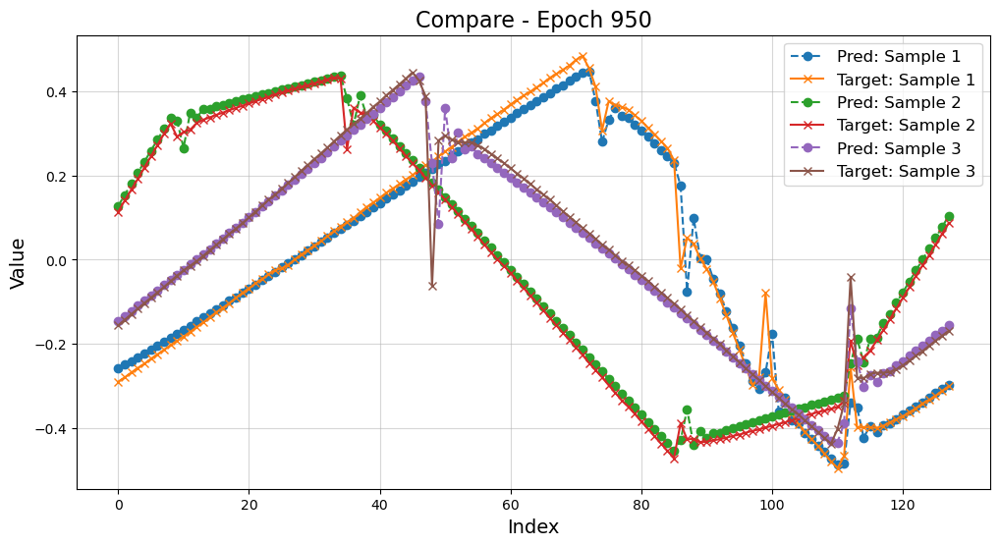

Epoch 951, Train Loss: 0.006224, Validation Loss: 0.005912
Epoch 952, Train Loss: 0.006206, Validation Loss: 0.005848
Saving model at epoch 952 with validation loss 0.005848...
Epoch 953, Train Loss: 0.006104, Validation Loss: 0.006092
Epoch 954, Train Loss: 0.006307, Validation Loss: 0.005923
Epoch 955, Train Loss: 0.006160, Validation Loss: 0.005843
Saving model at epoch 955 with validation loss 0.005843...
Epoch 956, Train Loss: 0.006269, Validation Loss: 0.005918
Epoch 957, Train Loss: 0.006313, Validation Loss: 0.005916
Epoch 958, Train Loss: 0.006280, Validation Loss: 0.006392
Epoch 959, Train Loss: 0.006345, Validation Loss: 0.006207
Epoch 960, Train Loss: 0.006335, Validation Loss: 0.005842
Saving model at epoch 960 with validation loss 0.005842...
Epoch 961, Train Loss: 0.006182, Validation Loss: 0.005902
Epoch 962, Train Loss: 0.006257, Validation Loss: 0.005840
Saving model at epoch 962 with validation loss 0.005840...
Epoch 963, Train Loss: 0.006138, Validation Loss: 0.0058

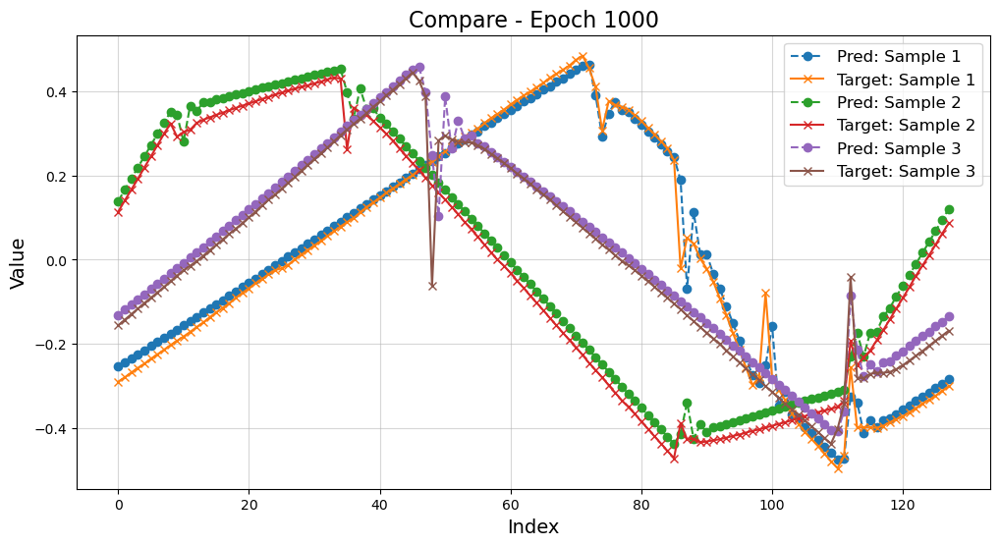

Epoch 1001, Train Loss: 0.006114, Validation Loss: 0.005777
Saving model at epoch 1001 with validation loss 0.005777...
Epoch 1002, Train Loss: 0.006011, Validation Loss: 0.005802
Epoch 1003, Train Loss: 0.006064, Validation Loss: 0.005856
Epoch 1004, Train Loss: 0.006174, Validation Loss: 0.005753
Saving model at epoch 1004 with validation loss 0.005753...
Epoch 1005, Train Loss: 0.006097, Validation Loss: 0.005873
Epoch 1006, Train Loss: 0.006165, Validation Loss: 0.005927
Epoch 1007, Train Loss: 0.006190, Validation Loss: 0.005815
Epoch 1008, Train Loss: 0.006179, Validation Loss: 0.005796
Epoch 1009, Train Loss: 0.006068, Validation Loss: 0.005984
Epoch 1010, Train Loss: 0.006077, Validation Loss: 0.005766
Epoch 1011, Train Loss: 0.006055, Validation Loss: 0.006068
Epoch 1012, Train Loss: 0.006175, Validation Loss: 0.005779
Epoch 1013, Train Loss: 0.006118, Validation Loss: 0.005889
Epoch 1014, Train Loss: 0.006125, Validation Loss: 0.005963
Epoch 1015, Train Loss: 0.006128, Valida

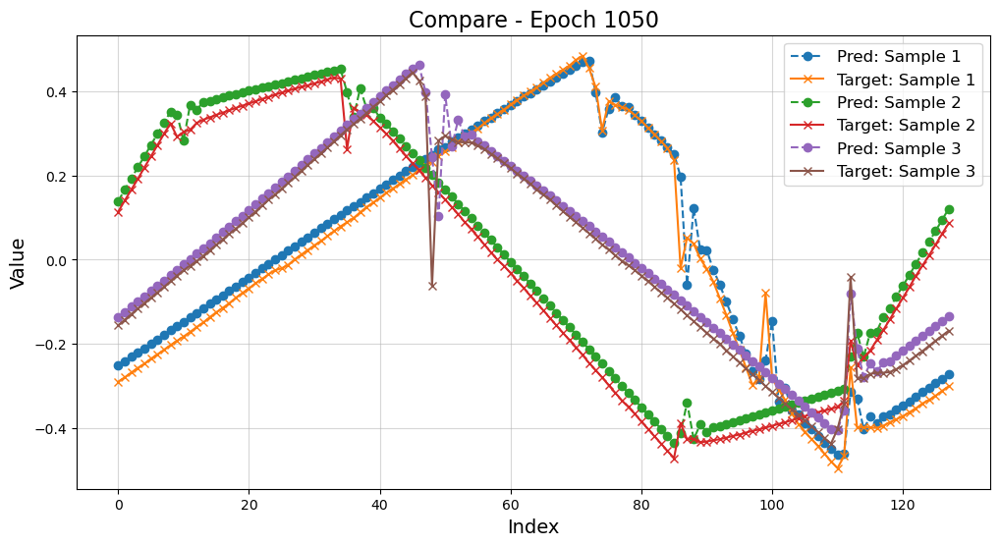

Epoch 1051, Train Loss: 0.006081, Validation Loss: 0.005752
Epoch 1052, Train Loss: 0.006111, Validation Loss: 0.005992
Epoch 1053, Train Loss: 0.006052, Validation Loss: 0.005656
Saving model at epoch 1053 with validation loss 0.005656...
Epoch 1054, Train Loss: 0.005999, Validation Loss: 0.005829
Epoch 1055, Train Loss: 0.005968, Validation Loss: 0.006601
Epoch 1056, Train Loss: 0.006091, Validation Loss: 0.005714
Epoch 1057, Train Loss: 0.006134, Validation Loss: 0.005864
Epoch 1058, Train Loss: 0.006313, Validation Loss: 0.005833
Epoch 1059, Train Loss: 0.006053, Validation Loss: 0.005789
Epoch 1060, Train Loss: 0.006253, Validation Loss: 0.005857
Epoch 1061, Train Loss: 0.006077, Validation Loss: 0.006051
Epoch 1062, Train Loss: 0.006008, Validation Loss: 0.005689
Epoch 1063, Train Loss: 0.006047, Validation Loss: 0.005690
Epoch 1064, Train Loss: 0.005944, Validation Loss: 0.005759
Epoch 1065, Train Loss: 0.005950, Validation Loss: 0.006028
Epoch 1066, Train Loss: 0.005994, Valida

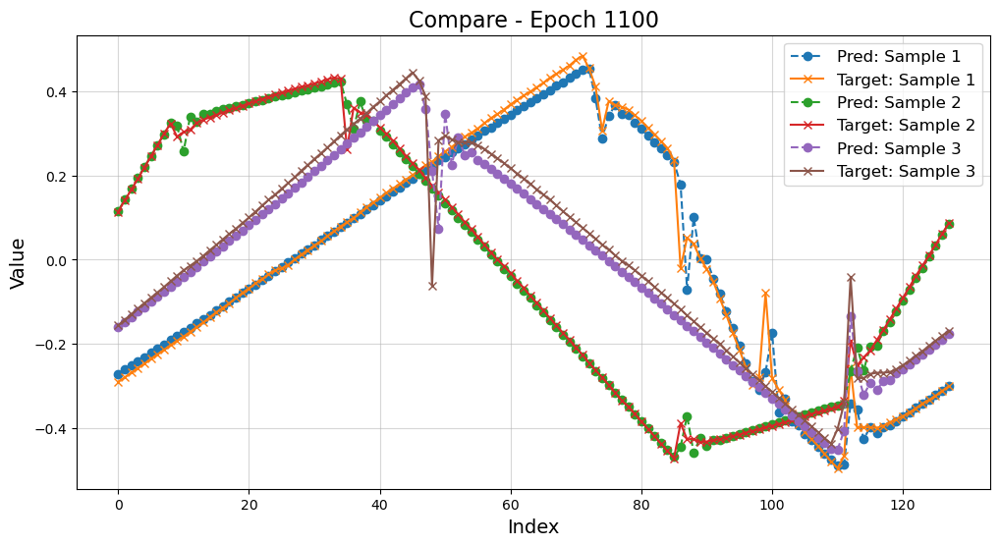

Epoch 1101, Train Loss: 0.005959, Validation Loss: 0.005952
Epoch 1102, Train Loss: 0.006091, Validation Loss: 0.005629
Epoch 1103, Train Loss: 0.005964, Validation Loss: 0.005588
Saving model at epoch 1103 with validation loss 0.005588...
Epoch 1104, Train Loss: 0.005893, Validation Loss: 0.005668
Epoch 1105, Train Loss: 0.005852, Validation Loss: 0.005602
Epoch 1106, Train Loss: 0.005867, Validation Loss: 0.005783
Epoch 1107, Train Loss: 0.006121, Validation Loss: 0.005630
Epoch 1108, Train Loss: 0.005947, Validation Loss: 0.005614
Epoch 1109, Train Loss: 0.005984, Validation Loss: 0.005656
Epoch 1110, Train Loss: 0.005986, Validation Loss: 0.005833
Epoch 1111, Train Loss: 0.005932, Validation Loss: 0.005698
Epoch 1112, Train Loss: 0.005917, Validation Loss: 0.005767
Epoch 1113, Train Loss: 0.005967, Validation Loss: 0.005639
Epoch 1114, Train Loss: 0.005898, Validation Loss: 0.005655
Epoch 1115, Train Loss: 0.006022, Validation Loss: 0.005582
Saving model at epoch 1115 with validati

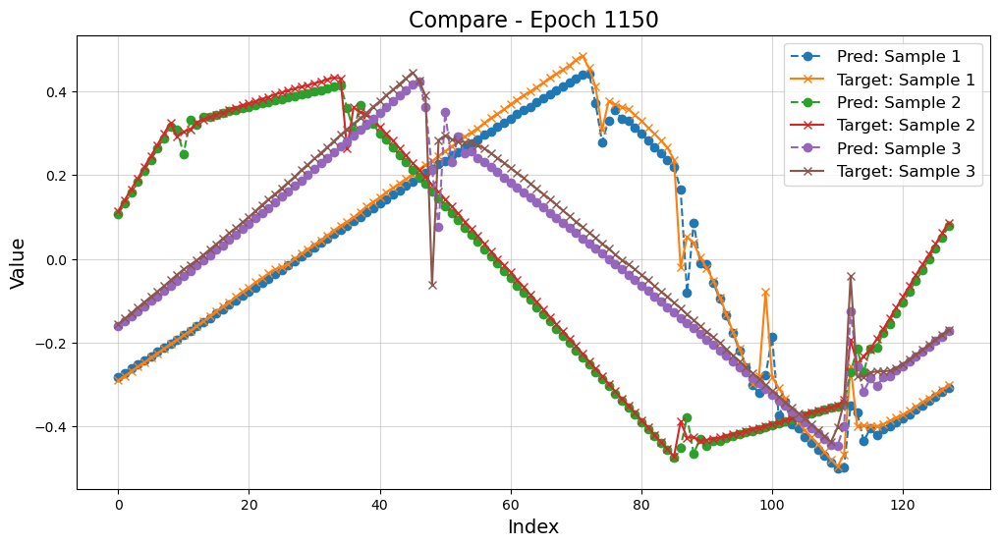

Epoch 1151, Train Loss: 0.005896, Validation Loss: 0.005813
Epoch 1152, Train Loss: 0.005983, Validation Loss: 0.005707
Epoch 1153, Train Loss: 0.005973, Validation Loss: 0.005722
Epoch 1154, Train Loss: 0.005910, Validation Loss: 0.005592
Epoch 1155, Train Loss: 0.005924, Validation Loss: 0.005588
Epoch 1156, Train Loss: 0.005821, Validation Loss: 0.005580
Epoch 1157, Train Loss: 0.005796, Validation Loss: 0.005514
Saving model at epoch 1157 with validation loss 0.005514...
Epoch 1158, Train Loss: 0.005866, Validation Loss: 0.005669
Epoch 1159, Train Loss: 0.005878, Validation Loss: 0.005706
Epoch 1160, Train Loss: 0.005979, Validation Loss: 0.005661
Epoch 1161, Train Loss: 0.005887, Validation Loss: 0.005825
Epoch 1162, Train Loss: 0.005869, Validation Loss: 0.005754
Epoch 1163, Train Loss: 0.005898, Validation Loss: 0.005660
Epoch 1164, Train Loss: 0.005857, Validation Loss: 0.005777
Epoch 1165, Train Loss: 0.005853, Validation Loss: 0.005672
Epoch 1166, Train Loss: 0.005896, Valida

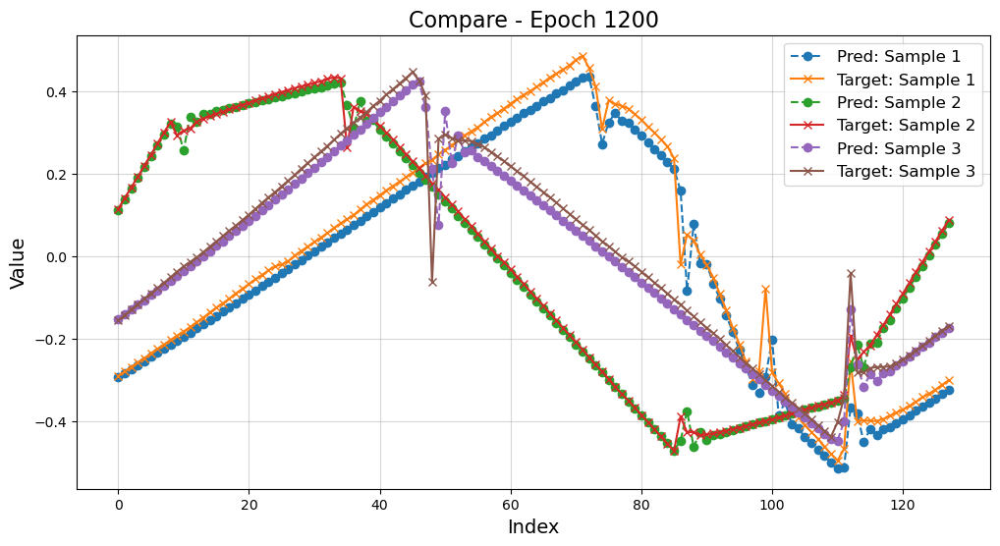

Epoch 1201, Train Loss: 0.005876, Validation Loss: 0.005570
Epoch 1202, Train Loss: 0.005759, Validation Loss: 0.005458
Saving model at epoch 1202 with validation loss 0.005458...
Epoch 1203, Train Loss: 0.005823, Validation Loss: 0.005526
Epoch 1204, Train Loss: 0.005795, Validation Loss: 0.005682
Epoch 1205, Train Loss: 0.005868, Validation Loss: 0.005612
Epoch 1206, Train Loss: 0.005834, Validation Loss: 0.005792
Epoch 1207, Train Loss: 0.005800, Validation Loss: 0.005539
Epoch 1208, Train Loss: 0.005764, Validation Loss: 0.005763
Epoch 1209, Train Loss: 0.005824, Validation Loss: 0.006203
Epoch 1210, Train Loss: 0.005813, Validation Loss: 0.005592
Epoch 1211, Train Loss: 0.005895, Validation Loss: 0.006192
Epoch 1212, Train Loss: 0.006075, Validation Loss: 0.005701
Epoch 1213, Train Loss: 0.005960, Validation Loss: 0.005673
Epoch 1214, Train Loss: 0.005830, Validation Loss: 0.005612
Epoch 1215, Train Loss: 0.005824, Validation Loss: 0.005550
Epoch 1216, Train Loss: 0.005734, Valida

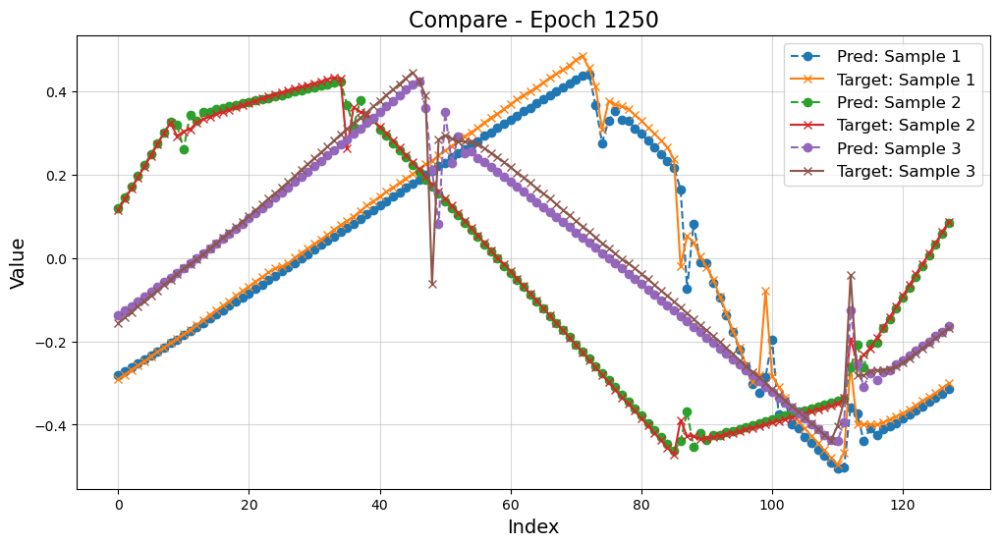

Epoch 1251, Train Loss: 0.005740, Validation Loss: 0.005537
Epoch 1252, Train Loss: 0.005716, Validation Loss: 0.005413
Epoch 1253, Train Loss: 0.005820, Validation Loss: 0.005525
Epoch 1254, Train Loss: 0.005700, Validation Loss: 0.005439
Epoch 1255, Train Loss: 0.005697, Validation Loss: 0.005732
Epoch 1256, Train Loss: 0.005864, Validation Loss: 0.005404
Epoch 1257, Train Loss: 0.005760, Validation Loss: 0.005462
Epoch 1258, Train Loss: 0.005837, Validation Loss: 0.005761
Epoch 1259, Train Loss: 0.005745, Validation Loss: 0.005639
Epoch 1260, Train Loss: 0.005762, Validation Loss: 0.005540
Epoch 1261, Train Loss: 0.005716, Validation Loss: 0.005781
Epoch 1262, Train Loss: 0.005715, Validation Loss: 0.005585
Epoch 1263, Train Loss: 0.005792, Validation Loss: 0.005430
Epoch 1264, Train Loss: 0.006006, Validation Loss: 0.005676
Epoch 1265, Train Loss: 0.005805, Validation Loss: 0.005439
Epoch 1266, Train Loss: 0.005770, Validation Loss: 0.005453
Epoch 1267, Train Loss: 0.005706, Valida

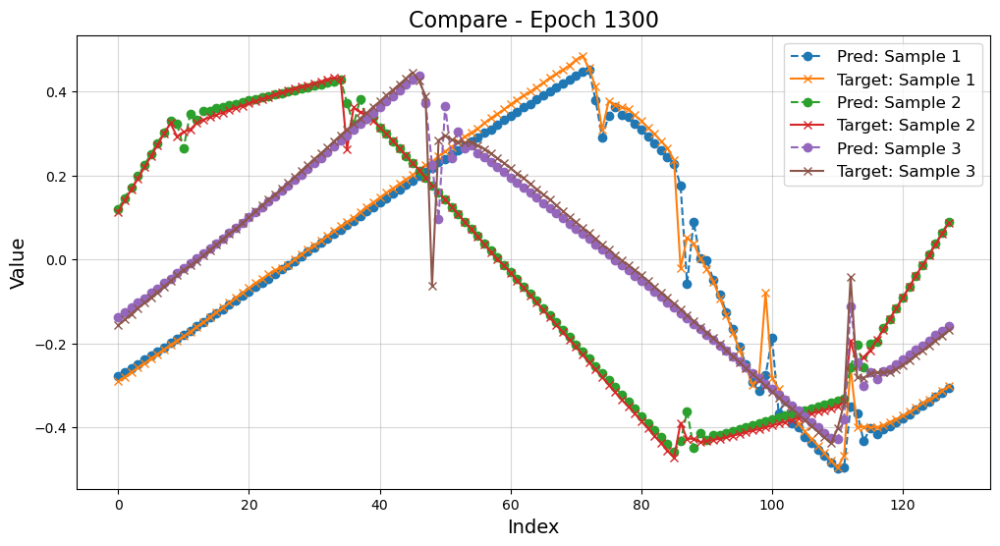

Saving model at epoch 1300 with validation loss 0.005367...
Epoch 1301, Train Loss: 0.005638, Validation Loss: 0.005422
Epoch 1302, Train Loss: 0.005641, Validation Loss: 0.005389
Epoch 1303, Train Loss: 0.005712, Validation Loss: 0.005512
Epoch 1304, Train Loss: 0.005649, Validation Loss: 0.005414
Epoch 1305, Train Loss: 0.005658, Validation Loss: 0.005355
Saving model at epoch 1305 with validation loss 0.005355...
Epoch 1306, Train Loss: 0.005731, Validation Loss: 0.005423
Epoch 1307, Train Loss: 0.005630, Validation Loss: 0.005517
Epoch 1308, Train Loss: 0.005701, Validation Loss: 0.005525
Epoch 1309, Train Loss: 0.005702, Validation Loss: 0.005748
Epoch 1310, Train Loss: 0.005650, Validation Loss: 0.005666
Epoch 1311, Train Loss: 0.005769, Validation Loss: 0.005662
Epoch 1312, Train Loss: 0.005767, Validation Loss: 0.005456
Epoch 1313, Train Loss: 0.005671, Validation Loss: 0.005310
Saving model at epoch 1313 with validation loss 0.005310...
Epoch 1314, Train Loss: 0.005604, Valida

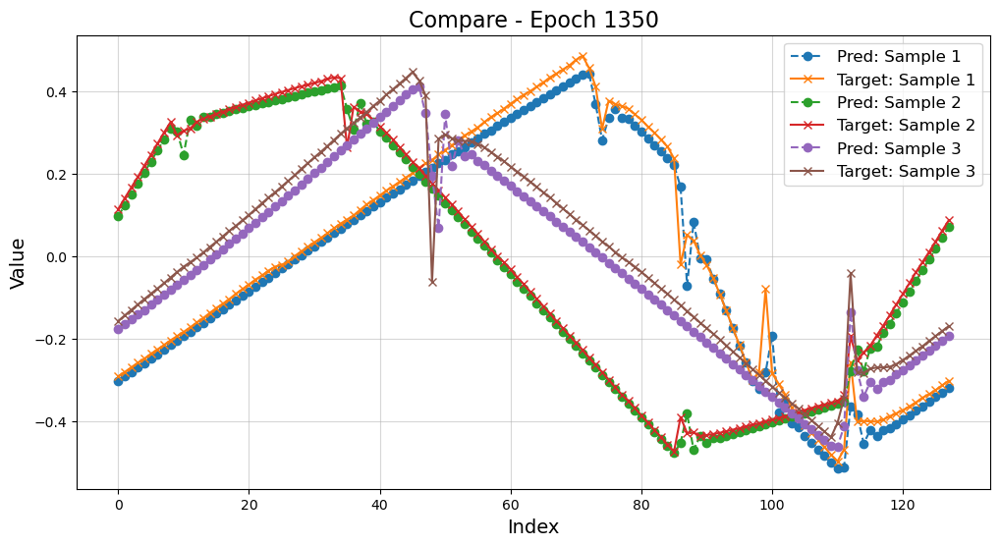

Epoch 1351, Train Loss: 0.005654, Validation Loss: 0.005292
Epoch 1352, Train Loss: 0.005662, Validation Loss: 0.005536
Epoch 1353, Train Loss: 0.005632, Validation Loss: 0.005292
Epoch 1354, Train Loss: 0.005759, Validation Loss: 0.005489
Epoch 1355, Train Loss: 0.005617, Validation Loss: 0.005397
Epoch 1356, Train Loss: 0.005529, Validation Loss: 0.005401
Epoch 1357, Train Loss: 0.005586, Validation Loss: 0.005371
Epoch 1358, Train Loss: 0.005541, Validation Loss: 0.005316
Epoch 1359, Train Loss: 0.005722, Validation Loss: 0.005545
Epoch 1360, Train Loss: 0.005744, Validation Loss: 0.005514
Epoch 1361, Train Loss: 0.005589, Validation Loss: 0.005248
Saving model at epoch 1361 with validation loss 0.005248...
Epoch 1362, Train Loss: 0.005556, Validation Loss: 0.005257
Epoch 1363, Train Loss: 0.005563, Validation Loss: 0.005319
Epoch 1364, Train Loss: 0.005633, Validation Loss: 0.005368
Epoch 1365, Train Loss: 0.005561, Validation Loss: 0.005496
Epoch 1366, Train Loss: 0.005750, Valida

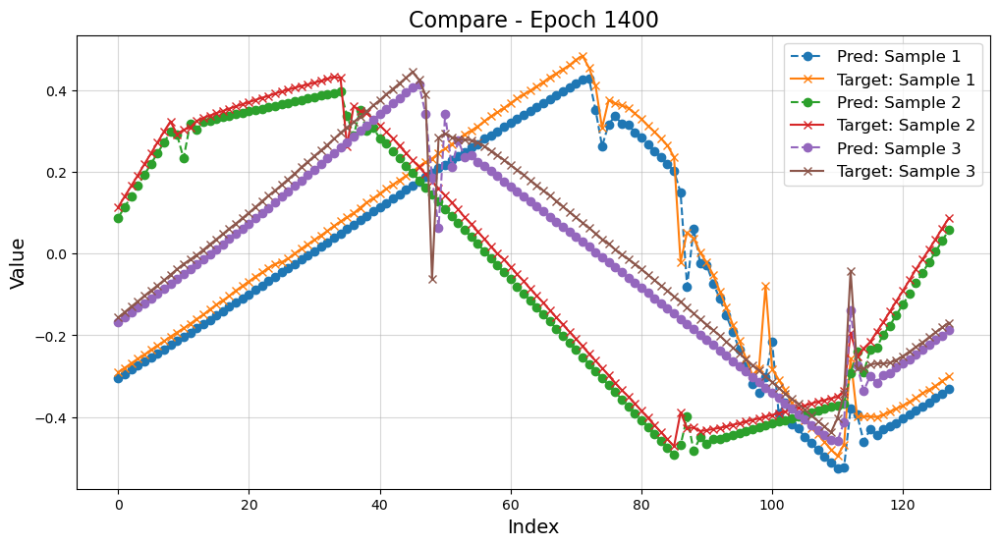

Epoch 1401, Train Loss: 0.005704, Validation Loss: 0.005235
Epoch 1402, Train Loss: 0.005578, Validation Loss: 0.005262
Epoch 1403, Train Loss: 0.005485, Validation Loss: 0.005252
Epoch 1404, Train Loss: 0.005705, Validation Loss: 0.005394
Epoch 1405, Train Loss: 0.005535, Validation Loss: 0.005713
Epoch 1406, Train Loss: 0.005524, Validation Loss: 0.005357
Epoch 1407, Train Loss: 0.005548, Validation Loss: 0.005288
Epoch 1408, Train Loss: 0.005526, Validation Loss: 0.005266
Epoch 1409, Train Loss: 0.005552, Validation Loss: 0.005484
Epoch 1410, Train Loss: 0.005610, Validation Loss: 0.005353
Epoch 1411, Train Loss: 0.005572, Validation Loss: 0.005199
Saving model at epoch 1411 with validation loss 0.005199...
Epoch 1412, Train Loss: 0.005690, Validation Loss: 0.005579
Epoch 1413, Train Loss: 0.005561, Validation Loss: 0.005334
Epoch 1414, Train Loss: 0.005651, Validation Loss: 0.005489
Epoch 1415, Train Loss: 0.005606, Validation Loss: 0.005367
Epoch 1416, Train Loss: 0.005686, Valida

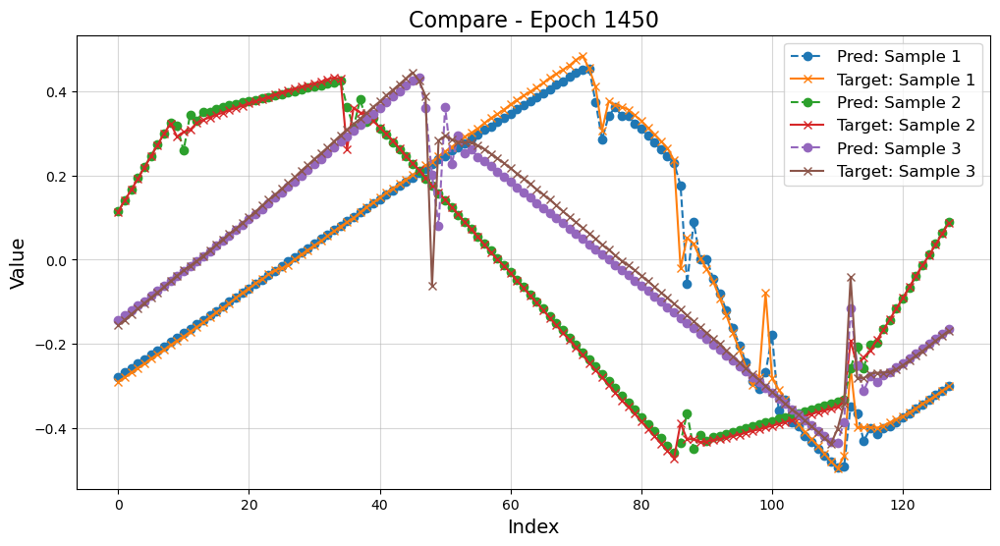

Saving model at epoch 1450 with validation loss 0.005145...
Epoch 1451, Train Loss: 0.005435, Validation Loss: 0.005155
Epoch 1452, Train Loss: 0.005511, Validation Loss: 0.005335
Epoch 1453, Train Loss: 0.005444, Validation Loss: 0.005223
Epoch 1454, Train Loss: 0.005499, Validation Loss: 0.005134
Saving model at epoch 1454 with validation loss 0.005134...
Epoch 1455, Train Loss: 0.005459, Validation Loss: 0.005270
Epoch 1456, Train Loss: 0.005460, Validation Loss: 0.005179
Epoch 1457, Train Loss: 0.005562, Validation Loss: 0.005544
Epoch 1458, Train Loss: 0.005456, Validation Loss: 0.005333
Epoch 1459, Train Loss: 0.005461, Validation Loss: 0.005209
Epoch 1460, Train Loss: 0.005493, Validation Loss: 0.005247
Epoch 1461, Train Loss: 0.005606, Validation Loss: 0.005253
Epoch 1462, Train Loss: 0.005449, Validation Loss: 0.005282
Epoch 1463, Train Loss: 0.005421, Validation Loss: 0.005162
Epoch 1464, Train Loss: 0.005433, Validation Loss: 0.005477
Epoch 1465, Train Loss: 0.005484, Valida

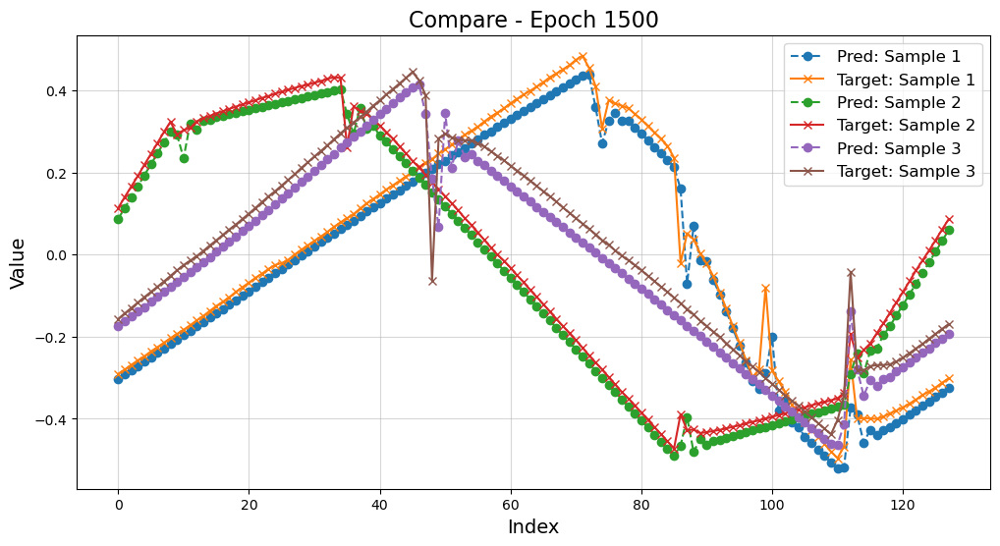

Epoch 1501, Train Loss: 0.005509, Validation Loss: 0.005233
Epoch 1502, Train Loss: 0.005389, Validation Loss: 0.005159
Epoch 1503, Train Loss: 0.005449, Validation Loss: 0.005670
Epoch 1504, Train Loss: 0.005490, Validation Loss: 0.005333
Epoch 1505, Train Loss: 0.005370, Validation Loss: 0.005195
Epoch 1506, Train Loss: 0.005445, Validation Loss: 0.005200
Epoch 1507, Train Loss: 0.005460, Validation Loss: 0.005185
Epoch 1508, Train Loss: 0.005427, Validation Loss: 0.005136
Epoch 1509, Train Loss: 0.005464, Validation Loss: 0.005166
Epoch 1510, Train Loss: 0.005542, Validation Loss: 0.005134
Epoch 1511, Train Loss: 0.005610, Validation Loss: 0.005372
Epoch 1512, Train Loss: 0.005453, Validation Loss: 0.005087
Saving model at epoch 1512 with validation loss 0.005087...
Epoch 1513, Train Loss: 0.005363, Validation Loss: 0.005221
Epoch 1514, Train Loss: 0.005419, Validation Loss: 0.005102
Epoch 1515, Train Loss: 0.005454, Validation Loss: 0.005096
Epoch 1516, Train Loss: 0.005370, Valida

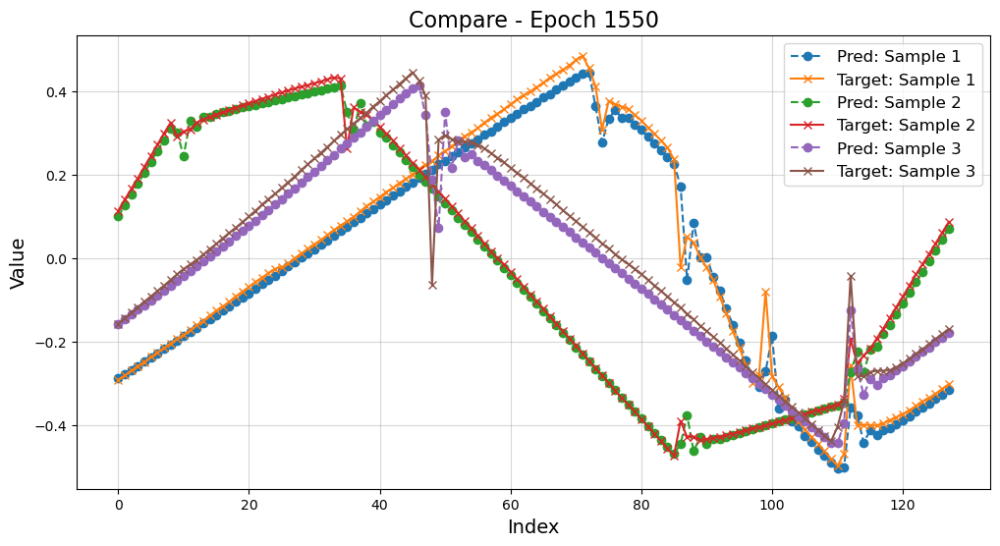

Epoch 1551, Train Loss: 0.005419, Validation Loss: 0.005194
Epoch 1552, Train Loss: 0.005312, Validation Loss: 0.005115
Epoch 1553, Train Loss: 0.005266, Validation Loss: 0.005106
Epoch 1554, Train Loss: 0.005278, Validation Loss: 0.005109
Epoch 1555, Train Loss: 0.005274, Validation Loss: 0.005063
Epoch 1556, Train Loss: 0.005364, Validation Loss: 0.005072
Epoch 1557, Train Loss: 0.005336, Validation Loss: 0.005228
Epoch 1558, Train Loss: 0.005435, Validation Loss: 0.005082
Epoch 1559, Train Loss: 0.005358, Validation Loss: 0.005168
Epoch 1560, Train Loss: 0.005330, Validation Loss: 0.005067
Epoch 1561, Train Loss: 0.005278, Validation Loss: 0.005158
Epoch 1562, Train Loss: 0.005285, Validation Loss: 0.005126
Epoch 1563, Train Loss: 0.005341, Validation Loss: 0.005398
Epoch 1564, Train Loss: 0.005523, Validation Loss: 0.005743
Epoch 1565, Train Loss: 0.005405, Validation Loss: 0.005058
Epoch 1566, Train Loss: 0.005284, Validation Loss: 0.005213
Epoch 1567, Train Loss: 0.005307, Valida

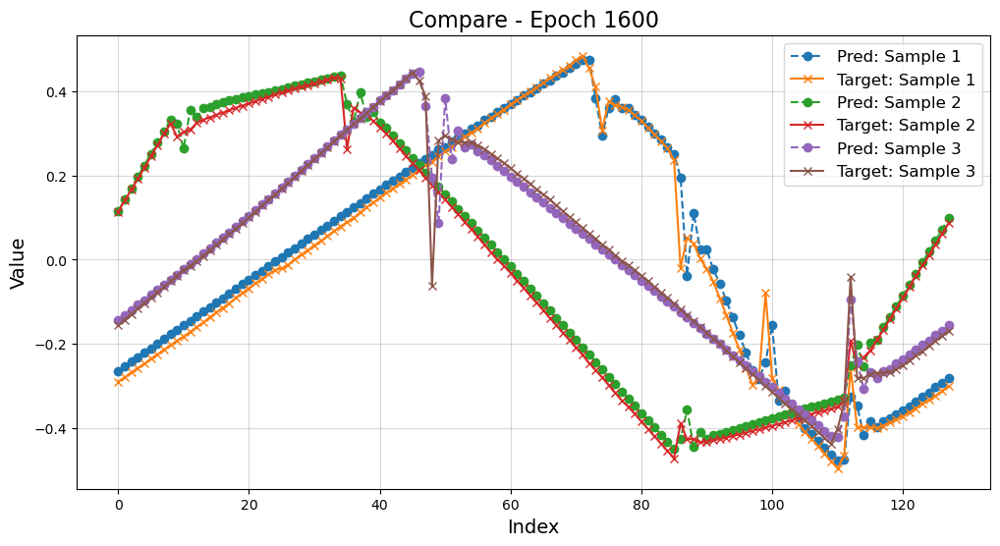

Epoch 1601, Train Loss: 0.005310, Validation Loss: 0.005039
Epoch 1602, Train Loss: 0.005263, Validation Loss: 0.005045
Epoch 1603, Train Loss: 0.005293, Validation Loss: 0.005093
Epoch 1604, Train Loss: 0.005268, Validation Loss: 0.005086
Epoch 1605, Train Loss: 0.005264, Validation Loss: 0.005384
Epoch 1606, Train Loss: 0.005337, Validation Loss: 0.005102
Epoch 1607, Train Loss: 0.005392, Validation Loss: 0.004965
Saving model at epoch 1607 with validation loss 0.004965...
Epoch 1608, Train Loss: 0.005234, Validation Loss: 0.005114
Epoch 1609, Train Loss: 0.005190, Validation Loss: 0.005171
Epoch 1610, Train Loss: 0.005348, Validation Loss: 0.005119
Epoch 1611, Train Loss: 0.005242, Validation Loss: 0.005052
Epoch 1612, Train Loss: 0.005279, Validation Loss: 0.005086
Epoch 1613, Train Loss: 0.005473, Validation Loss: 0.004997
Epoch 1614, Train Loss: 0.005243, Validation Loss: 0.004966
Epoch 1615, Train Loss: 0.005441, Validation Loss: 0.005131
Epoch 1616, Train Loss: 0.005275, Valida

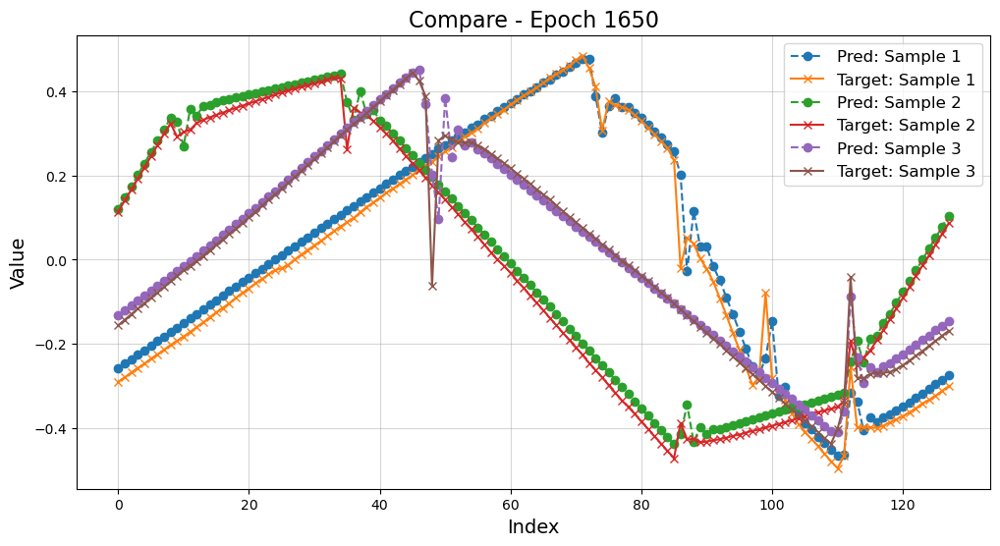

Epoch 1651, Train Loss: 0.005304, Validation Loss: 0.005328
Epoch 1652, Train Loss: 0.005297, Validation Loss: 0.005175
Epoch 1653, Train Loss: 0.005254, Validation Loss: 0.005044
Epoch 1654, Train Loss: 0.005221, Validation Loss: 0.004925
Epoch 1655, Train Loss: 0.005281, Validation Loss: 0.004915
Epoch 1656, Train Loss: 0.005219, Validation Loss: 0.004983
Epoch 1657, Train Loss: 0.005198, Validation Loss: 0.004986
Epoch 1658, Train Loss: 0.005429, Validation Loss: 0.005092
Epoch 1659, Train Loss: 0.005388, Validation Loss: 0.004966
Epoch 1660, Train Loss: 0.005245, Validation Loss: 0.005008
Epoch 1661, Train Loss: 0.005256, Validation Loss: 0.004963
Epoch 1662, Train Loss: 0.005220, Validation Loss: 0.004975
Epoch 1663, Train Loss: 0.005161, Validation Loss: 0.005062
Epoch 1664, Train Loss: 0.005214, Validation Loss: 0.004986
Epoch 1665, Train Loss: 0.005168, Validation Loss: 0.004962
Epoch 1666, Train Loss: 0.005194, Validation Loss: 0.004978
Epoch 1667, Train Loss: 0.005214, Valida

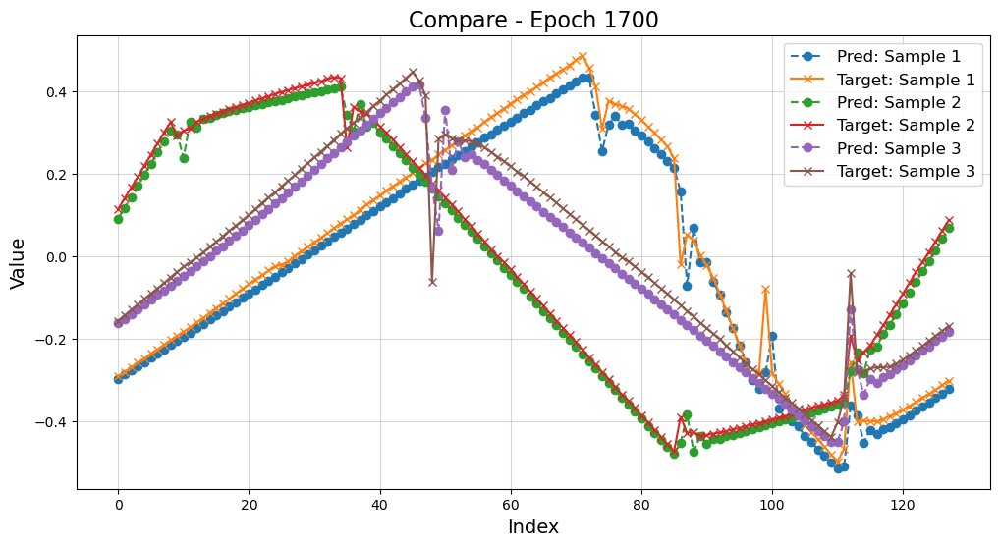

Epoch 1701, Train Loss: 0.005268, Validation Loss: 0.005071
Epoch 1702, Train Loss: 0.005243, Validation Loss: 0.004986
Epoch 1703, Train Loss: 0.005139, Validation Loss: 0.004938
Epoch 1704, Train Loss: 0.005267, Validation Loss: 0.004989
Epoch 1705, Train Loss: 0.005141, Validation Loss: 0.004910
Epoch 1706, Train Loss: 0.005168, Validation Loss: 0.004856
Saving model at epoch 1706 with validation loss 0.004856...
Epoch 1707, Train Loss: 0.005131, Validation Loss: 0.004983
Epoch 1708, Train Loss: 0.005184, Validation Loss: 0.004849
Saving model at epoch 1708 with validation loss 0.004849...
Epoch 1709, Train Loss: 0.005075, Validation Loss: 0.004859
Epoch 1710, Train Loss: 0.005210, Validation Loss: 0.004972
Epoch 1711, Train Loss: 0.005186, Validation Loss: 0.004903
Epoch 1712, Train Loss: 0.005144, Validation Loss: 0.004976
Epoch 1713, Train Loss: 0.005173, Validation Loss: 0.004960
Epoch 1714, Train Loss: 0.005167, Validation Loss: 0.005062
Epoch 1715, Train Loss: 0.005300, Valida

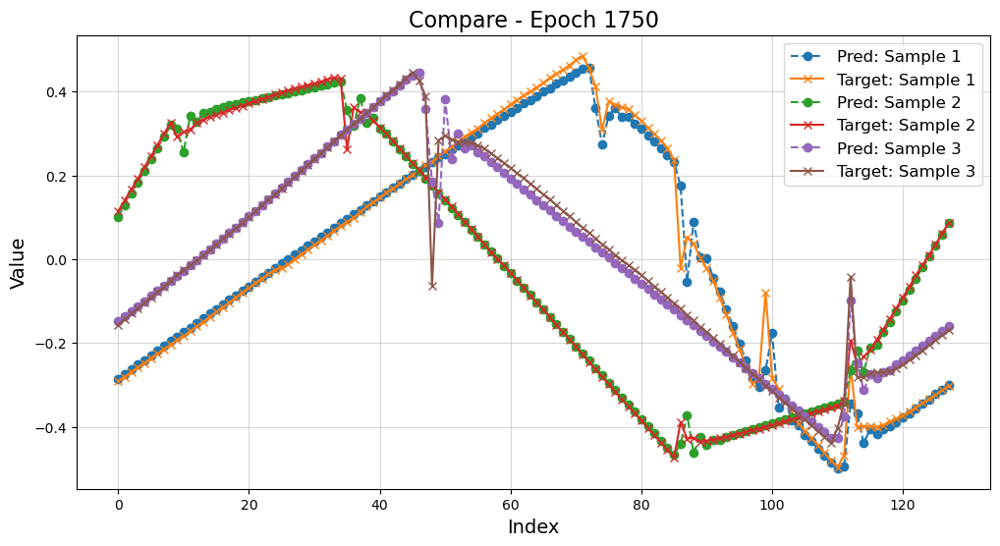

Epoch 1751, Train Loss: 0.005158, Validation Loss: 0.004890
Epoch 1752, Train Loss: 0.005168, Validation Loss: 0.005356
Epoch 1753, Train Loss: 0.005264, Validation Loss: 0.004888
Epoch 1754, Train Loss: 0.005099, Validation Loss: 0.005134
Epoch 1755, Train Loss: 0.005193, Validation Loss: 0.004915
Epoch 1756, Train Loss: 0.005134, Validation Loss: 0.004899
Epoch 1757, Train Loss: 0.005045, Validation Loss: 0.004897
Epoch 1758, Train Loss: 0.005072, Validation Loss: 0.004832
Saving model at epoch 1758 with validation loss 0.004832...
Epoch 1759, Train Loss: 0.005020, Validation Loss: 0.004811
Saving model at epoch 1759 with validation loss 0.004811...
Epoch 1760, Train Loss: 0.005067, Validation Loss: 0.005021
Epoch 1761, Train Loss: 0.005119, Validation Loss: 0.004914
Epoch 1762, Train Loss: 0.005198, Validation Loss: 0.004860
Epoch 1763, Train Loss: 0.005088, Validation Loss: 0.005106
Epoch 1764, Train Loss: 0.005130, Validation Loss: 0.005020
Epoch 1765, Train Loss: 0.005065, Valida

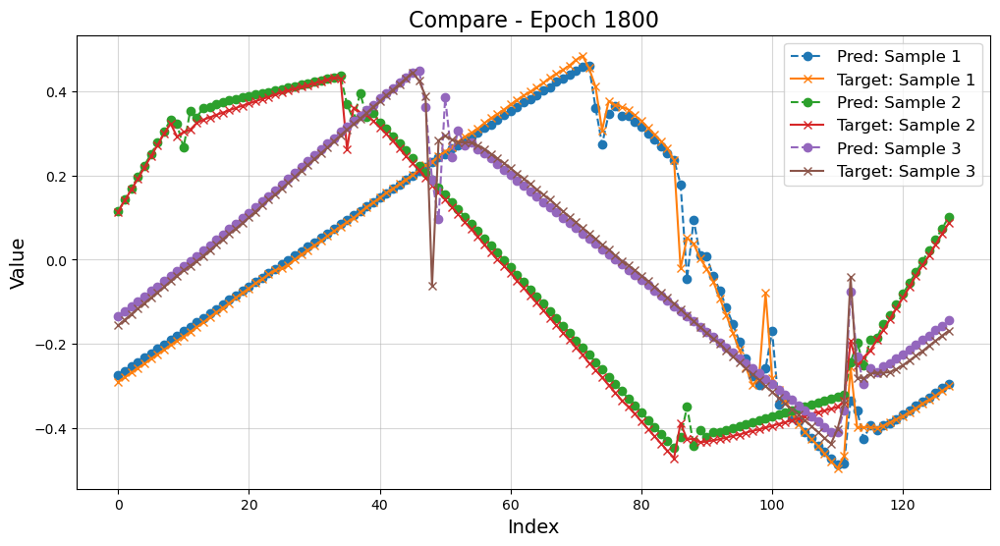

Epoch 1801, Train Loss: 0.005060, Validation Loss: 0.004827
Epoch 1802, Train Loss: 0.005039, Validation Loss: 0.004815
Epoch 1803, Train Loss: 0.005029, Validation Loss: 0.004810
Epoch 1804, Train Loss: 0.005052, Validation Loss: 0.004892
Epoch 1805, Train Loss: 0.005095, Validation Loss: 0.004936
Epoch 1806, Train Loss: 0.005043, Validation Loss: 0.004836
Epoch 1807, Train Loss: 0.005091, Validation Loss: 0.004997
Epoch 1808, Train Loss: 0.005039, Validation Loss: 0.004886
Epoch 1809, Train Loss: 0.005149, Validation Loss: 0.004963
Epoch 1810, Train Loss: 0.005066, Validation Loss: 0.005020
Epoch 1811, Train Loss: 0.005044, Validation Loss: 0.004803
Epoch 1812, Train Loss: 0.005107, Validation Loss: 0.005316
Epoch 1813, Train Loss: 0.005144, Validation Loss: 0.004948
Epoch 1814, Train Loss: 0.005191, Validation Loss: 0.004937
Epoch 1815, Train Loss: 0.005225, Validation Loss: 0.005112
Epoch 1816, Train Loss: 0.005063, Validation Loss: 0.004823
Epoch 1817, Train Loss: 0.005043, Valida

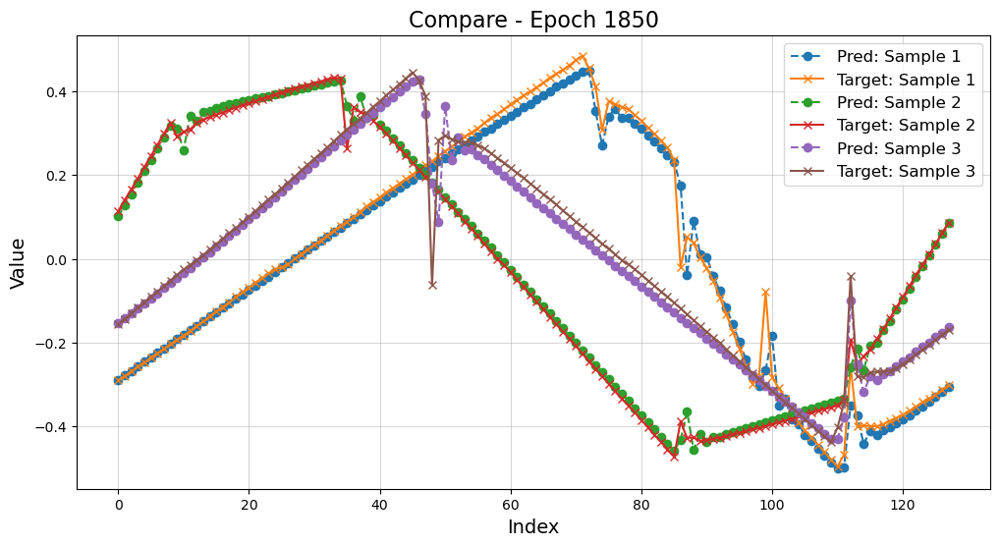

Epoch 1851, Train Loss: 0.005085, Validation Loss: 0.004996
Epoch 1852, Train Loss: 0.005165, Validation Loss: 0.004753
Saving model at epoch 1852 with validation loss 0.004753...
Epoch 1853, Train Loss: 0.005087, Validation Loss: 0.004788
Epoch 1854, Train Loss: 0.005069, Validation Loss: 0.004903
Epoch 1855, Train Loss: 0.005009, Validation Loss: 0.004776
Epoch 1856, Train Loss: 0.004956, Validation Loss: 0.004782
Epoch 1857, Train Loss: 0.005009, Validation Loss: 0.004952
Epoch 1858, Train Loss: 0.005030, Validation Loss: 0.004943
Epoch 1859, Train Loss: 0.005255, Validation Loss: 0.004978
Epoch 1860, Train Loss: 0.005053, Validation Loss: 0.004886
Epoch 1861, Train Loss: 0.004987, Validation Loss: 0.004841
Epoch 1862, Train Loss: 0.004959, Validation Loss: 0.004808
Epoch 1863, Train Loss: 0.005033, Validation Loss: 0.004915
Epoch 1864, Train Loss: 0.005138, Validation Loss: 0.004760
Epoch 1865, Train Loss: 0.004995, Validation Loss: 0.004843
Epoch 1866, Train Loss: 0.005027, Valida

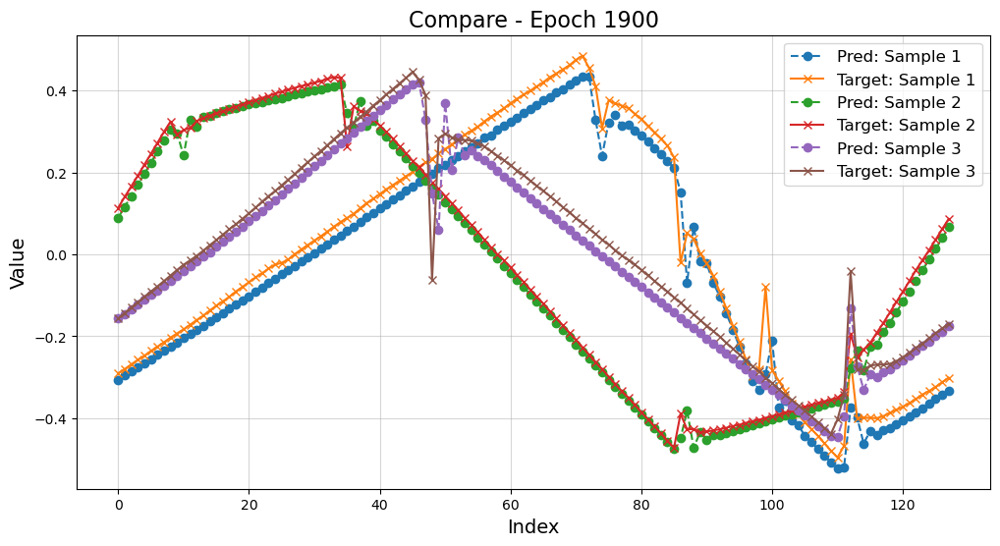

Epoch 1901, Train Loss: 0.005178, Validation Loss: 0.004948
Epoch 1902, Train Loss: 0.005101, Validation Loss: 0.004773
Epoch 1903, Train Loss: 0.004968, Validation Loss: 0.004806
Epoch 1904, Train Loss: 0.004904, Validation Loss: 0.004774
Epoch 1905, Train Loss: 0.005023, Validation Loss: 0.005589
Epoch 1906, Train Loss: 0.005122, Validation Loss: 0.004850
Epoch 1907, Train Loss: 0.004990, Validation Loss: 0.004830
Epoch 1908, Train Loss: 0.004979, Validation Loss: 0.004715
Epoch 1909, Train Loss: 0.005010, Validation Loss: 0.005012
Epoch 1910, Train Loss: 0.004969, Validation Loss: 0.004730
Epoch 1911, Train Loss: 0.004994, Validation Loss: 0.004695
Saving model at epoch 1911 with validation loss 0.004695...
Epoch 1912, Train Loss: 0.005050, Validation Loss: 0.004846
Epoch 1913, Train Loss: 0.005049, Validation Loss: 0.004809
Epoch 1914, Train Loss: 0.004977, Validation Loss: 0.004761
Epoch 1915, Train Loss: 0.004947, Validation Loss: 0.004832
Epoch 1916, Train Loss: 0.005007, Valida

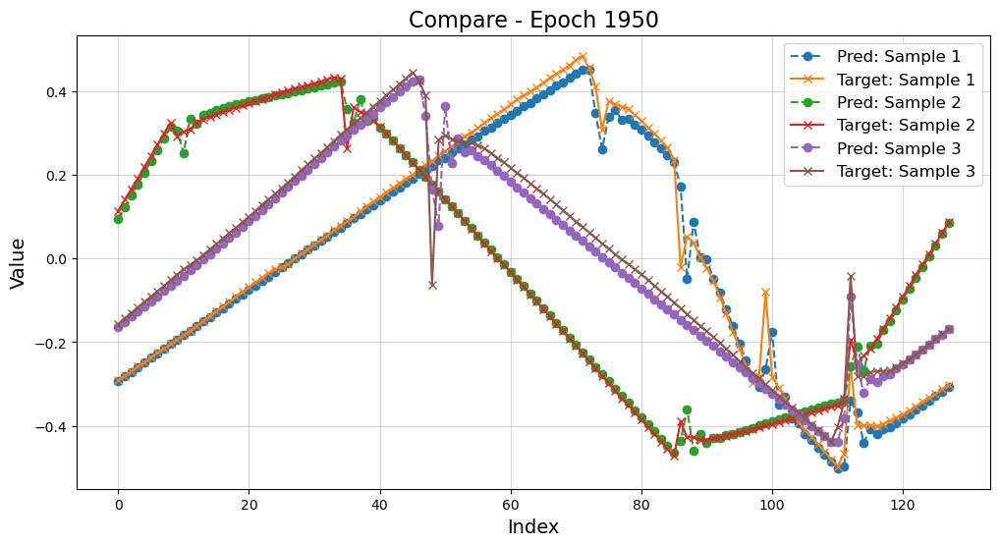

Epoch 1951, Train Loss: 0.004951, Validation Loss: 0.004693
Epoch 1952, Train Loss: 0.004890, Validation Loss: 0.004635
Saving model at epoch 1952 with validation loss 0.004635...
Epoch 1953, Train Loss: 0.004927, Validation Loss: 0.005101
Epoch 1954, Train Loss: 0.004959, Validation Loss: 0.004938
Epoch 1955, Train Loss: 0.004947, Validation Loss: 0.004897
Epoch 1956, Train Loss: 0.005005, Validation Loss: 0.004778
Epoch 1957, Train Loss: 0.005049, Validation Loss: 0.004713
Epoch 1958, Train Loss: 0.004972, Validation Loss: 0.004868
Epoch 1959, Train Loss: 0.004967, Validation Loss: 0.004677
Epoch 1960, Train Loss: 0.004879, Validation Loss: 0.004808
Epoch 1961, Train Loss: 0.004841, Validation Loss: 0.005157
Epoch 1962, Train Loss: 0.005125, Validation Loss: 0.004785
Epoch 1963, Train Loss: 0.004936, Validation Loss: 0.004648
Epoch 1964, Train Loss: 0.004851, Validation Loss: 0.004726
Epoch 1965, Train Loss: 0.004966, Validation Loss: 0.004659
Epoch 1966, Train Loss: 0.004934, Valida

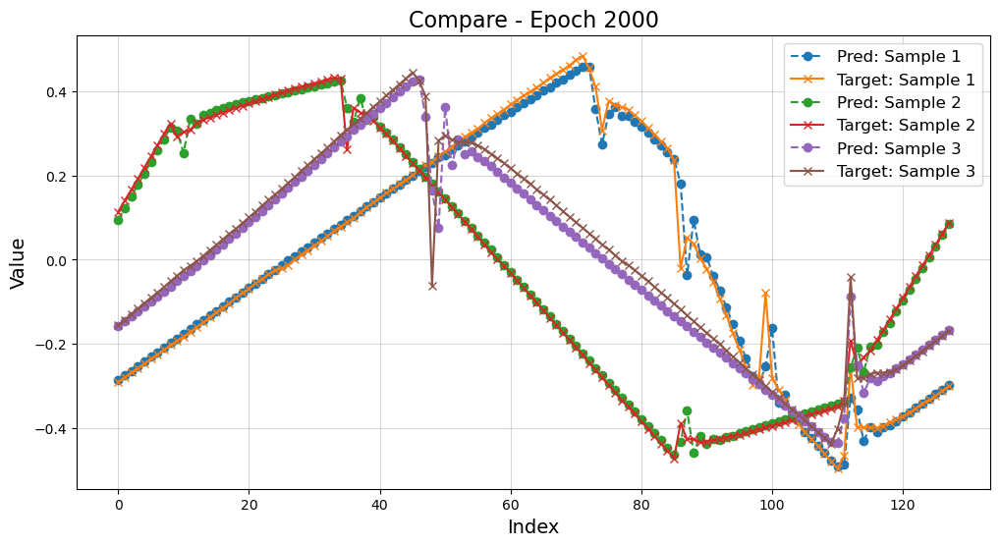

Epoch 2001, Train Loss: 0.004950, Validation Loss: 0.004623
Saving model at epoch 2001 with validation loss 0.004623...
Epoch 2002, Train Loss: 0.004860, Validation Loss: 0.004705
Epoch 2003, Train Loss: 0.004884, Validation Loss: 0.004750
Epoch 2004, Train Loss: 0.005029, Validation Loss: 0.004634
Epoch 2005, Train Loss: 0.004859, Validation Loss: 0.004712
Epoch 2006, Train Loss: 0.004960, Validation Loss: 0.004752
Epoch 2007, Train Loss: 0.004899, Validation Loss: 0.004653
Epoch 2008, Train Loss: 0.004927, Validation Loss: 0.005208
Epoch 2009, Train Loss: 0.005000, Validation Loss: 0.004725
Epoch 2010, Train Loss: 0.004869, Validation Loss: 0.004730
Epoch 2011, Train Loss: 0.005020, Validation Loss: 0.004666
Epoch 2012, Train Loss: 0.004914, Validation Loss: 0.004758
Epoch 2013, Train Loss: 0.004916, Validation Loss: 0.004652
Epoch 2014, Train Loss: 0.004892, Validation Loss: 0.004962
Epoch 2015, Train Loss: 0.004855, Validation Loss: 0.004636
Epoch 2016, Train Loss: 0.004843, Valida

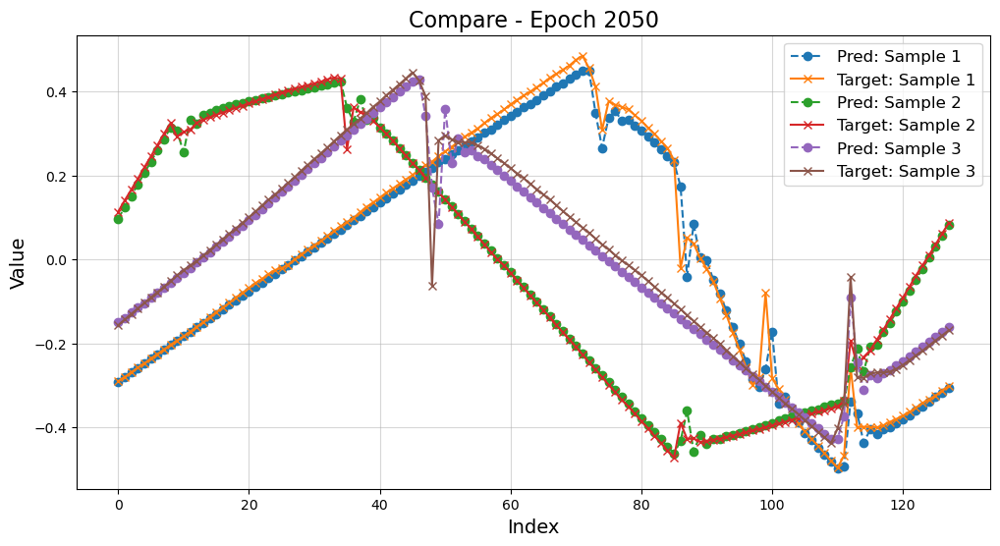

Epoch 2051, Train Loss: 0.004889, Validation Loss: 0.004768
Epoch 2052, Train Loss: 0.004891, Validation Loss: 0.004729
Epoch 2053, Train Loss: 0.004846, Validation Loss: 0.004609
Epoch 2054, Train Loss: 0.004799, Validation Loss: 0.004601
Epoch 2055, Train Loss: 0.004802, Validation Loss: 0.004614
Epoch 2056, Train Loss: 0.004830, Validation Loss: 0.004767
Epoch 2057, Train Loss: 0.004970, Validation Loss: 0.004664
Epoch 2058, Train Loss: 0.004948, Validation Loss: 0.004905
Epoch 2059, Train Loss: 0.004902, Validation Loss: 0.004819
Epoch 2060, Train Loss: 0.004846, Validation Loss: 0.004604
Epoch 2061, Train Loss: 0.004830, Validation Loss: 0.004596
Epoch 2062, Train Loss: 0.005038, Validation Loss: 0.004868
Epoch 2063, Train Loss: 0.004885, Validation Loss: 0.004656
Epoch 2064, Train Loss: 0.004875, Validation Loss: 0.004848
Epoch 2065, Train Loss: 0.004826, Validation Loss: 0.004556
Saving model at epoch 2065 with validation loss 0.004556...
Epoch 2066, Train Loss: 0.004826, Valida

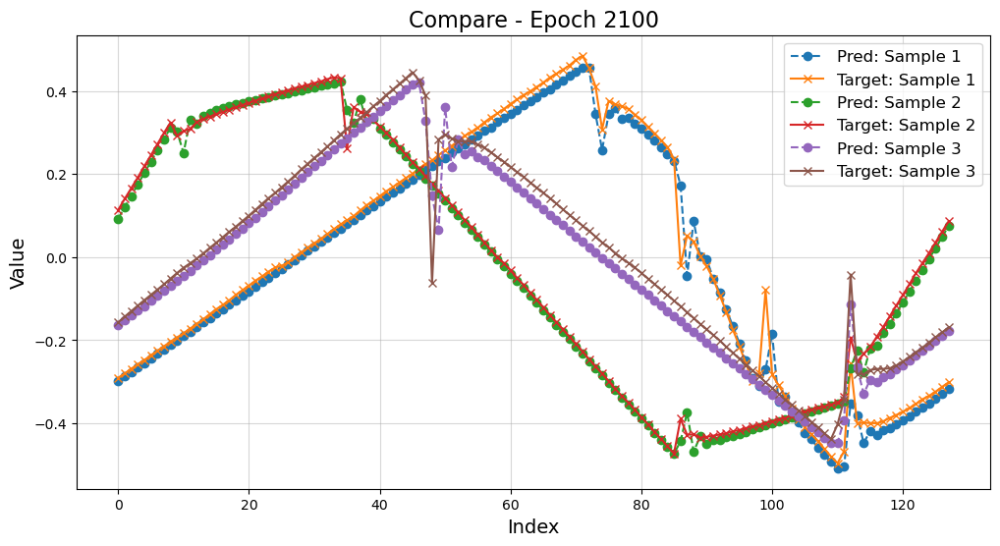

Epoch 2101, Train Loss: 0.004852, Validation Loss: 0.004708
Epoch 2102, Train Loss: 0.004777, Validation Loss: 0.004586
Epoch 2103, Train Loss: 0.004774, Validation Loss: 0.004586
Epoch 2104, Train Loss: 0.004838, Validation Loss: 0.004660
Epoch 2105, Train Loss: 0.004826, Validation Loss: 0.004596
Epoch 2106, Train Loss: 0.004766, Validation Loss: 0.004648
Epoch 2107, Train Loss: 0.004733, Validation Loss: 0.004579
Epoch 2108, Train Loss: 0.004792, Validation Loss: 0.004708
Epoch 2109, Train Loss: 0.004834, Validation Loss: 0.004638
Epoch 2110, Train Loss: 0.004827, Validation Loss: 0.004570
Epoch 2111, Train Loss: 0.004727, Validation Loss: 0.004597
Epoch 2112, Train Loss: 0.004781, Validation Loss: 0.004634
Epoch 2113, Train Loss: 0.004851, Validation Loss: 0.004541
Saving model at epoch 2113 with validation loss 0.004541...
Epoch 2114, Train Loss: 0.004809, Validation Loss: 0.005585
Epoch 2115, Train Loss: 0.005092, Validation Loss: 0.005130
Epoch 2116, Train Loss: 0.004908, Valida

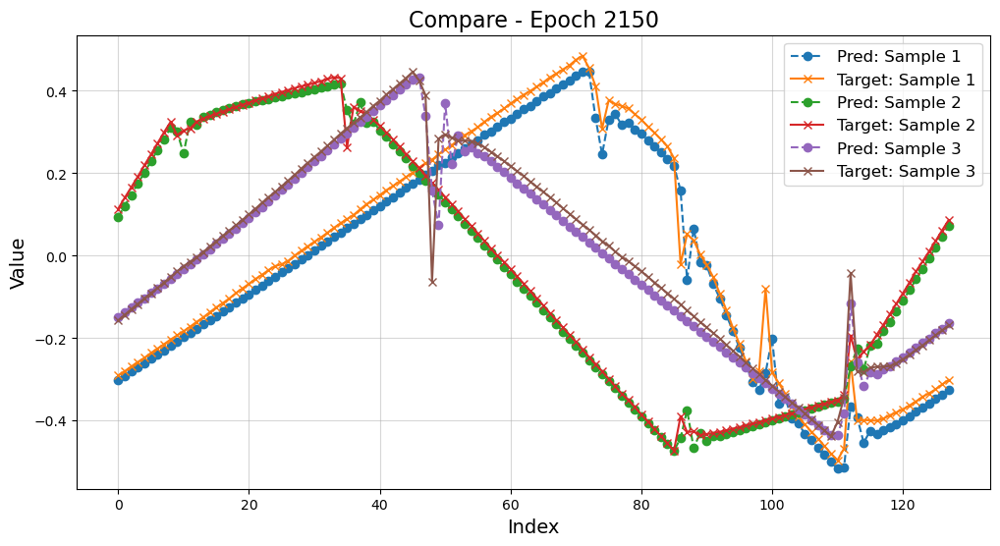

Epoch 2151, Train Loss: 0.004797, Validation Loss: 0.004682
Epoch 2152, Train Loss: 0.004847, Validation Loss: 0.004678
Epoch 2153, Train Loss: 0.004750, Validation Loss: 0.004581
Epoch 2154, Train Loss: 0.004920, Validation Loss: 0.004689
Epoch 2155, Train Loss: 0.004868, Validation Loss: 0.004681
Epoch 2156, Train Loss: 0.004814, Validation Loss: 0.004722
Epoch 2157, Train Loss: 0.004904, Validation Loss: 0.004630
Epoch 2158, Train Loss: 0.004759, Validation Loss: 0.004655
Epoch 2159, Train Loss: 0.004808, Validation Loss: 0.004490
Saving model at epoch 2159 with validation loss 0.004490...
Epoch 2160, Train Loss: 0.004756, Validation Loss: 0.004504
Epoch 2161, Train Loss: 0.004811, Validation Loss: 0.004574
Epoch 2162, Train Loss: 0.004878, Validation Loss: 0.004832
Epoch 2163, Train Loss: 0.004793, Validation Loss: 0.004632
Epoch 2164, Train Loss: 0.004748, Validation Loss: 0.004576
Epoch 2165, Train Loss: 0.004773, Validation Loss: 0.004662
Epoch 2166, Train Loss: 0.004775, Valida

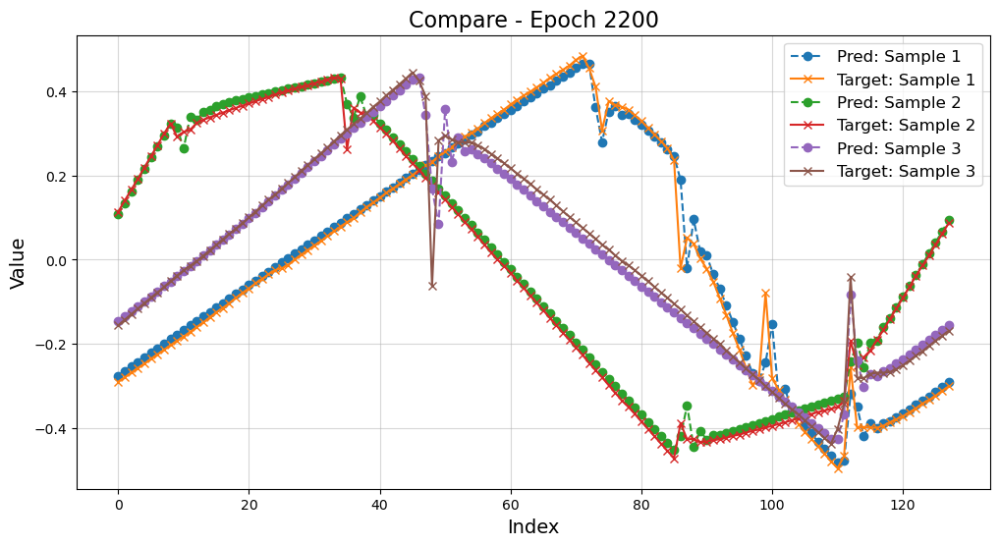

Epoch 2201, Train Loss: 0.004724, Validation Loss: 0.004539
Epoch 2202, Train Loss: 0.004769, Validation Loss: 0.004521
Epoch 2203, Train Loss: 0.004762, Validation Loss: 0.004824
Epoch 2204, Train Loss: 0.004778, Validation Loss: 0.004570
Epoch 2205, Train Loss: 0.004735, Validation Loss: 0.004567
Epoch 2206, Train Loss: 0.004751, Validation Loss: 0.004461
Saving model at epoch 2206 with validation loss 0.004461...
Epoch 2207, Train Loss: 0.004724, Validation Loss: 0.004614
Epoch 2208, Train Loss: 0.004850, Validation Loss: 0.004647
Epoch 2209, Train Loss: 0.004749, Validation Loss: 0.004771
Epoch 2210, Train Loss: 0.004712, Validation Loss: 0.004524
Epoch 2211, Train Loss: 0.004705, Validation Loss: 0.004915
Epoch 2212, Train Loss: 0.004765, Validation Loss: 0.004460
Saving model at epoch 2212 with validation loss 0.004460...
Epoch 2213, Train Loss: 0.004774, Validation Loss: 0.004696
Epoch 2214, Train Loss: 0.004724, Validation Loss: 0.004539
Epoch 2215, Train Loss: 0.004798, Valida

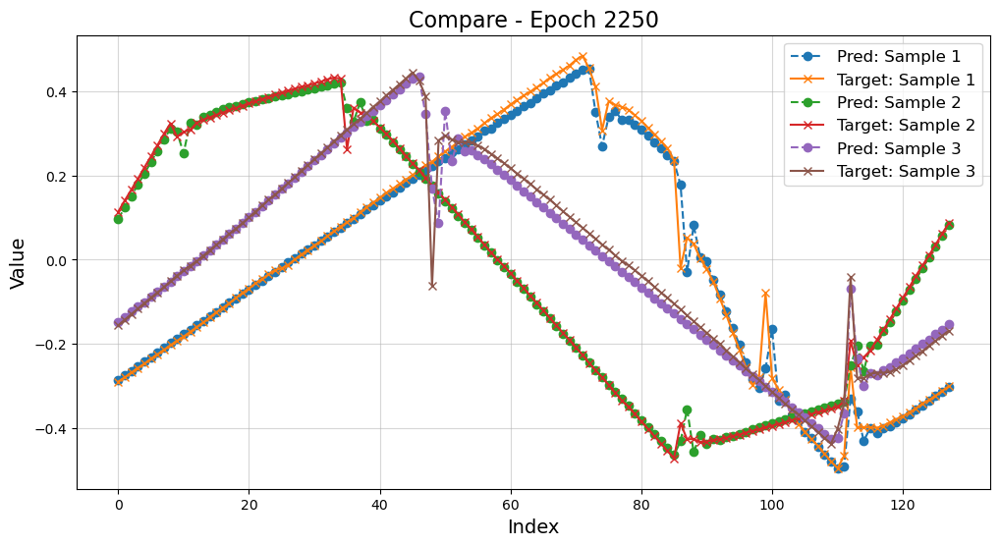

Epoch 2251, Train Loss: 0.004844, Validation Loss: 0.004633
Epoch 2252, Train Loss: 0.004715, Validation Loss: 0.004457
Saving model at epoch 2252 with validation loss 0.004457...
Epoch 2253, Train Loss: 0.004700, Validation Loss: 0.004671
Epoch 2254, Train Loss: 0.004738, Validation Loss: 0.004515
Epoch 2255, Train Loss: 0.004655, Validation Loss: 0.004532
Epoch 2256, Train Loss: 0.004665, Validation Loss: 0.004460
Epoch 2257, Train Loss: 0.004737, Validation Loss: 0.004474
Epoch 2258, Train Loss: 0.004711, Validation Loss: 0.004448
Saving model at epoch 2258 with validation loss 0.004448...
Epoch 2259, Train Loss: 0.004686, Validation Loss: 0.004479
Epoch 2260, Train Loss: 0.004660, Validation Loss: 0.004536
Epoch 2261, Train Loss: 0.004704, Validation Loss: 0.004449
Epoch 2262, Train Loss: 0.004668, Validation Loss: 0.004597
Epoch 2263, Train Loss: 0.004717, Validation Loss: 0.004671
Epoch 2264, Train Loss: 0.004736, Validation Loss: 0.004548
Epoch 2265, Train Loss: 0.004703, Valida

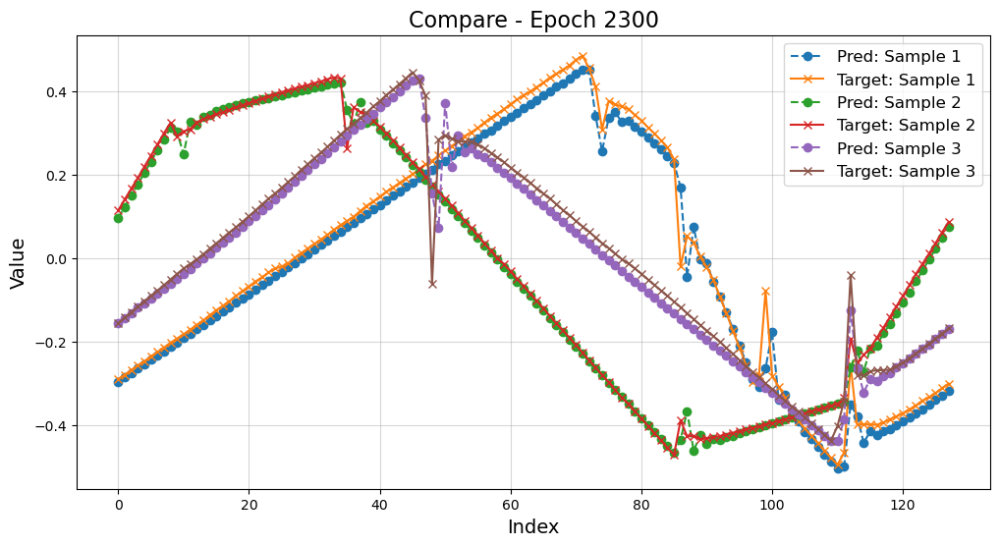

Epoch 2301, Train Loss: 0.004976, Validation Loss: 0.004676
Epoch 2302, Train Loss: 0.004836, Validation Loss: 0.004498
Epoch 2303, Train Loss: 0.004806, Validation Loss: 0.004517
Epoch 2304, Train Loss: 0.004658, Validation Loss: 0.004481
Epoch 2305, Train Loss: 0.004690, Validation Loss: 0.004484
Epoch 2306, Train Loss: 0.004628, Validation Loss: 0.004588
Epoch 2307, Train Loss: 0.004712, Validation Loss: 0.004454
Epoch 2308, Train Loss: 0.004858, Validation Loss: 0.004814
Epoch 2309, Train Loss: 0.004887, Validation Loss: 0.004882
Epoch 2310, Train Loss: 0.004758, Validation Loss: 0.004531
Epoch 2311, Train Loss: 0.004687, Validation Loss: 0.004541
Epoch 2312, Train Loss: 0.004691, Validation Loss: 0.004533
Epoch 2313, Train Loss: 0.004685, Validation Loss: 0.004501
Epoch 2314, Train Loss: 0.004669, Validation Loss: 0.004505
Epoch 2315, Train Loss: 0.004715, Validation Loss: 0.004709
Epoch 2316, Train Loss: 0.004691, Validation Loss: 0.004496
Epoch 2317, Train Loss: 0.004690, Valida

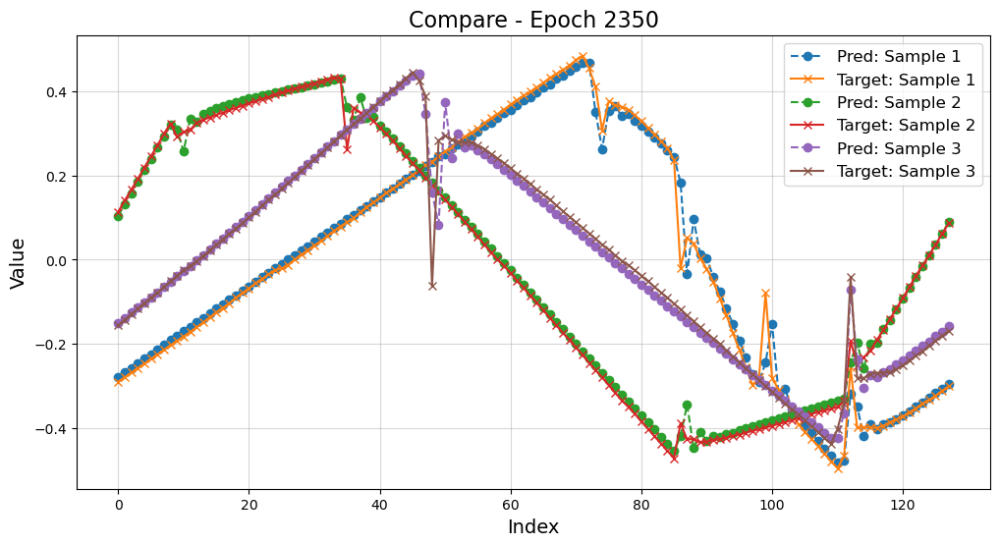

Epoch 2351, Train Loss: 0.004606, Validation Loss: 0.004418
Epoch 2352, Train Loss: 0.004647, Validation Loss: 0.004501
Epoch 2353, Train Loss: 0.004655, Validation Loss: 0.004580
Epoch 2354, Train Loss: 0.004635, Validation Loss: 0.004518
Epoch 2355, Train Loss: 0.004596, Validation Loss: 0.004426
Epoch 2356, Train Loss: 0.004599, Validation Loss: 0.004524
Epoch 2357, Train Loss: 0.004686, Validation Loss: 0.004585
Epoch 2358, Train Loss: 0.004709, Validation Loss: 0.004453
Epoch 2359, Train Loss: 0.004587, Validation Loss: 0.004411
Epoch 2360, Train Loss: 0.004643, Validation Loss: 0.004583
Epoch 2361, Train Loss: 0.004647, Validation Loss: 0.004409
Epoch 2362, Train Loss: 0.004694, Validation Loss: 0.004641
Epoch 2363, Train Loss: 0.004696, Validation Loss: 0.004620
Epoch 2364, Train Loss: 0.004633, Validation Loss: 0.004706
Epoch 2365, Train Loss: 0.004670, Validation Loss: 0.004446
Epoch 2366, Train Loss: 0.004670, Validation Loss: 0.004591
Epoch 2367, Train Loss: 0.004663, Valida

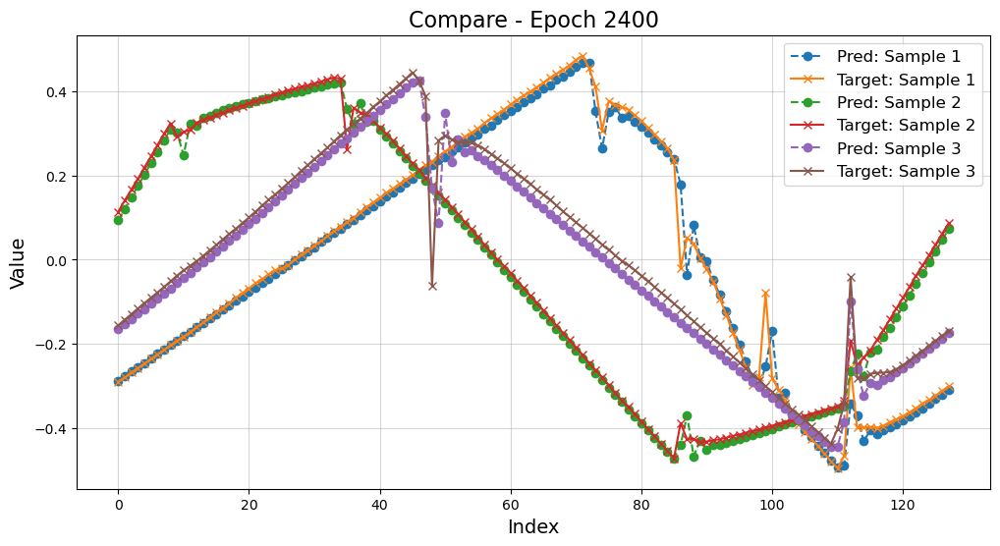

Epoch 2401, Train Loss: 0.004657, Validation Loss: 0.004453
Epoch 2402, Train Loss: 0.004643, Validation Loss: 0.004504
Epoch 2403, Train Loss: 0.004727, Validation Loss: 0.004530
Epoch 2404, Train Loss: 0.004625, Validation Loss: 0.004530
Epoch 2405, Train Loss: 0.004634, Validation Loss: 0.004461
Epoch 2406, Train Loss: 0.004653, Validation Loss: 0.004647
Epoch 2407, Train Loss: 0.004633, Validation Loss: 0.004594
Epoch 2408, Train Loss: 0.004606, Validation Loss: 0.004481
Epoch 2409, Train Loss: 0.004638, Validation Loss: 0.004475
Epoch 2410, Train Loss: 0.004672, Validation Loss: 0.004424
Epoch 2411, Train Loss: 0.004553, Validation Loss: 0.004596
Epoch 2412, Train Loss: 0.004700, Validation Loss: 0.004476
Epoch 2413, Train Loss: 0.004628, Validation Loss: 0.004494
Epoch 2414, Train Loss: 0.004649, Validation Loss: 0.004455
Epoch 2415, Train Loss: 0.004656, Validation Loss: 0.004431
Epoch 2416, Train Loss: 0.004608, Validation Loss: 0.004400
Saving model at epoch 2416 with validati

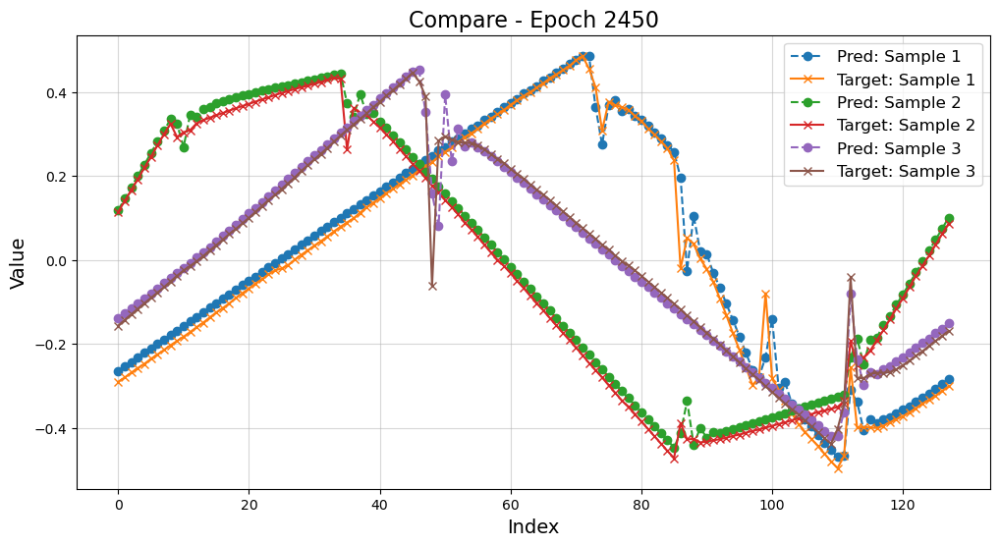

Epoch 2451, Train Loss: 0.004787, Validation Loss: 0.004799
Epoch 2452, Train Loss: 0.004707, Validation Loss: 0.004519
Epoch 2453, Train Loss: 0.004817, Validation Loss: 0.004406
Epoch 2454, Train Loss: 0.004659, Validation Loss: 0.004379
Epoch 2455, Train Loss: 0.004540, Validation Loss: 0.004496
Epoch 2456, Train Loss: 0.004637, Validation Loss: 0.004346
Saving model at epoch 2456 with validation loss 0.004346...
Epoch 2457, Train Loss: 0.004669, Validation Loss: 0.004545
Epoch 2458, Train Loss: 0.004675, Validation Loss: 0.004438
Epoch 2459, Train Loss: 0.004671, Validation Loss: 0.004475
Epoch 2460, Train Loss: 0.004695, Validation Loss: 0.004669
Epoch 2461, Train Loss: 0.004601, Validation Loss: 0.004398
Epoch 2462, Train Loss: 0.004596, Validation Loss: 0.004334
Saving model at epoch 2462 with validation loss 0.004334...
Epoch 2463, Train Loss: 0.004622, Validation Loss: 0.004453
Epoch 2464, Train Loss: 0.004641, Validation Loss: 0.004618
Epoch 2465, Train Loss: 0.004698, Valida

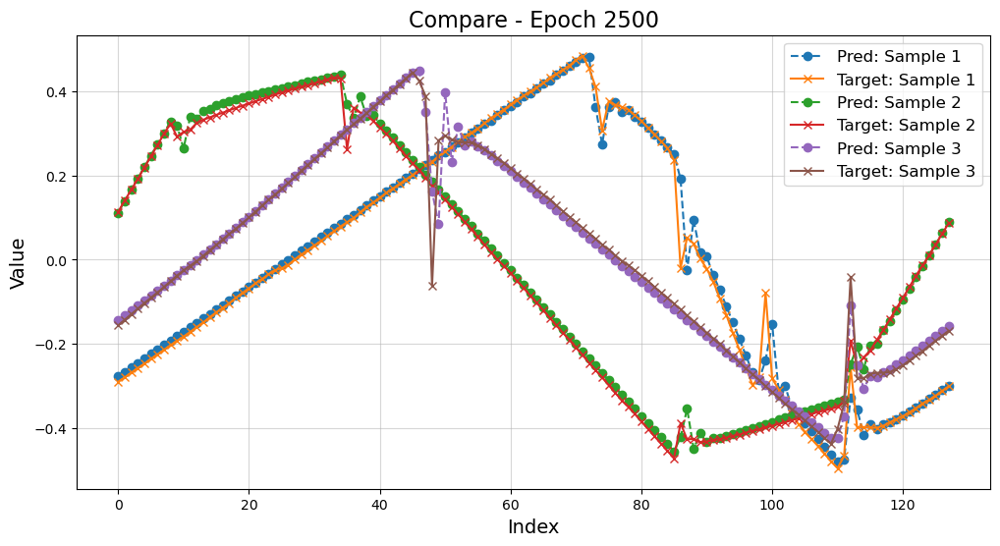

Epoch 2501, Train Loss: 0.004664, Validation Loss: 0.004384
Epoch 2502, Train Loss: 0.004567, Validation Loss: 0.004327
Saving model at epoch 2502 with validation loss 0.004327...
Epoch 2503, Train Loss: 0.004566, Validation Loss: 0.004393
Epoch 2504, Train Loss: 0.004792, Validation Loss: 0.004494
Epoch 2505, Train Loss: 0.004638, Validation Loss: 0.004441
Epoch 2506, Train Loss: 0.004647, Validation Loss: 0.004392
Epoch 2507, Train Loss: 0.004566, Validation Loss: 0.004446
Epoch 2508, Train Loss: 0.004645, Validation Loss: 0.004485
Epoch 2509, Train Loss: 0.004665, Validation Loss: 0.004548
Epoch 2510, Train Loss: 0.004691, Validation Loss: 0.004454
Epoch 2511, Train Loss: 0.004600, Validation Loss: 0.004449
Epoch 2512, Train Loss: 0.004557, Validation Loss: 0.004405
Epoch 2513, Train Loss: 0.004640, Validation Loss: 0.004608
Epoch 2514, Train Loss: 0.004614, Validation Loss: 0.004580
Epoch 2515, Train Loss: 0.004547, Validation Loss: 0.004423
Epoch 2516, Train Loss: 0.004565, Valida

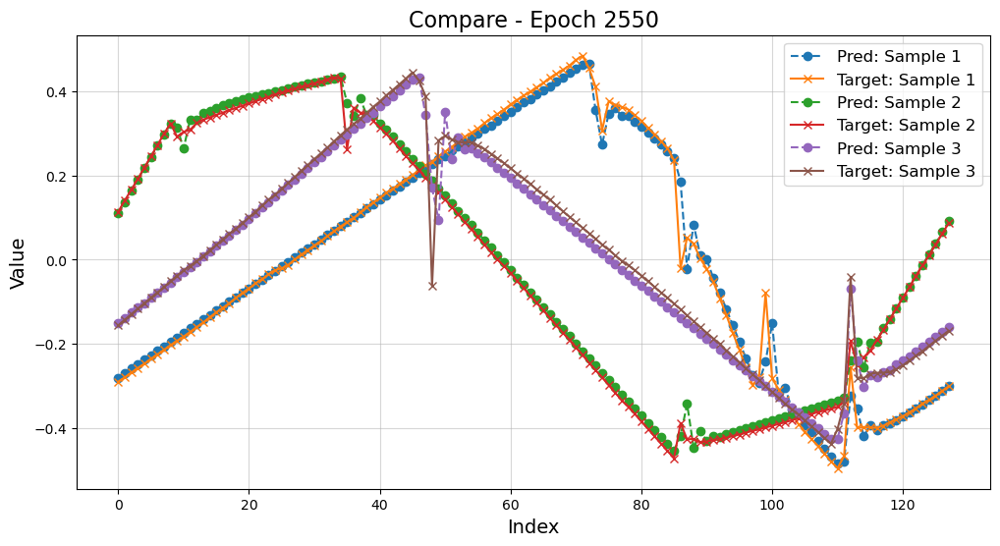

Epoch 2551, Train Loss: 0.004574, Validation Loss: 0.004491
Epoch 2552, Train Loss: 0.004563, Validation Loss: 0.004353
Epoch 2553, Train Loss: 0.004662, Validation Loss: 0.004470
Epoch 2554, Train Loss: 0.004550, Validation Loss: 0.004368
Epoch 2555, Train Loss: 0.004488, Validation Loss: 0.004331
Epoch 2556, Train Loss: 0.004641, Validation Loss: 0.004422
Epoch 2557, Train Loss: 0.004530, Validation Loss: 0.004555
Epoch 2558, Train Loss: 0.004581, Validation Loss: 0.004416
Epoch 2559, Train Loss: 0.004532, Validation Loss: 0.004426
Epoch 2560, Train Loss: 0.004609, Validation Loss: 0.004741
Epoch 2561, Train Loss: 0.004698, Validation Loss: 0.004460
Epoch 2562, Train Loss: 0.004628, Validation Loss: 0.004327
Saving model at epoch 2562 with validation loss 0.004327...
Epoch 2563, Train Loss: 0.004488, Validation Loss: 0.004600
Epoch 2564, Train Loss: 0.004590, Validation Loss: 0.004512
Epoch 2565, Train Loss: 0.004695, Validation Loss: 0.004759
Epoch 2566, Train Loss: 0.004615, Valida

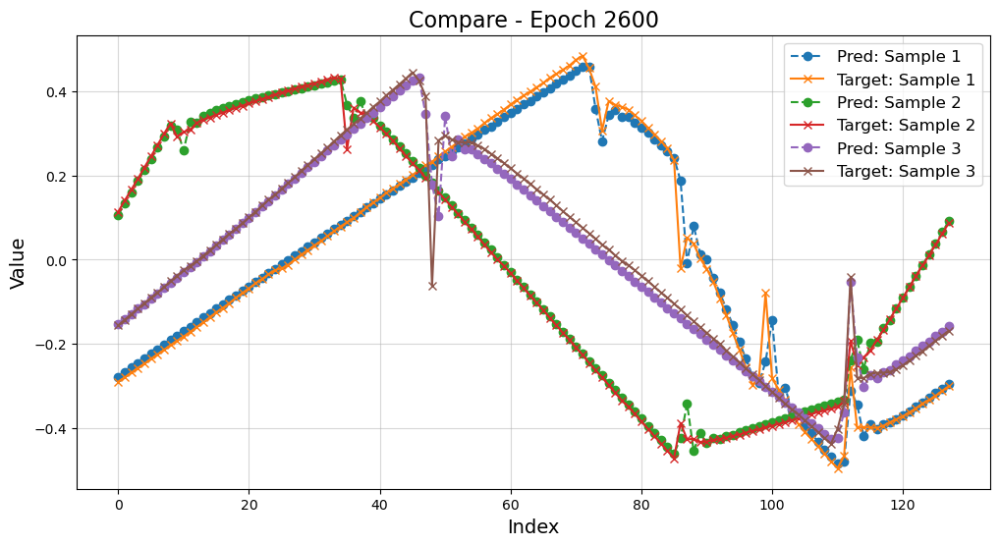

Epoch 2601, Train Loss: 0.004555, Validation Loss: 0.004366
Epoch 2602, Train Loss: 0.004520, Validation Loss: 0.004345
Epoch 2603, Train Loss: 0.004508, Validation Loss: 0.004389
Epoch 2604, Train Loss: 0.004515, Validation Loss: 0.004644
Epoch 2605, Train Loss: 0.004601, Validation Loss: 0.004371
Epoch 2606, Train Loss: 0.004514, Validation Loss: 0.004387
Epoch 2607, Train Loss: 0.004509, Validation Loss: 0.004341
Epoch 2608, Train Loss: 0.004541, Validation Loss: 0.004505
Epoch 2609, Train Loss: 0.004722, Validation Loss: 0.004451
Epoch 2610, Train Loss: 0.004660, Validation Loss: 0.004370
Epoch 2611, Train Loss: 0.004546, Validation Loss: 0.004344
Epoch 2612, Train Loss: 0.004455, Validation Loss: 0.004388
Epoch 2613, Train Loss: 0.004494, Validation Loss: 0.004322
Epoch 2614, Train Loss: 0.004587, Validation Loss: 0.004443
Epoch 2615, Train Loss: 0.004590, Validation Loss: 0.004387
Epoch 2616, Train Loss: 0.004588, Validation Loss: 0.004739
Epoch 2617, Train Loss: 0.004753, Valida

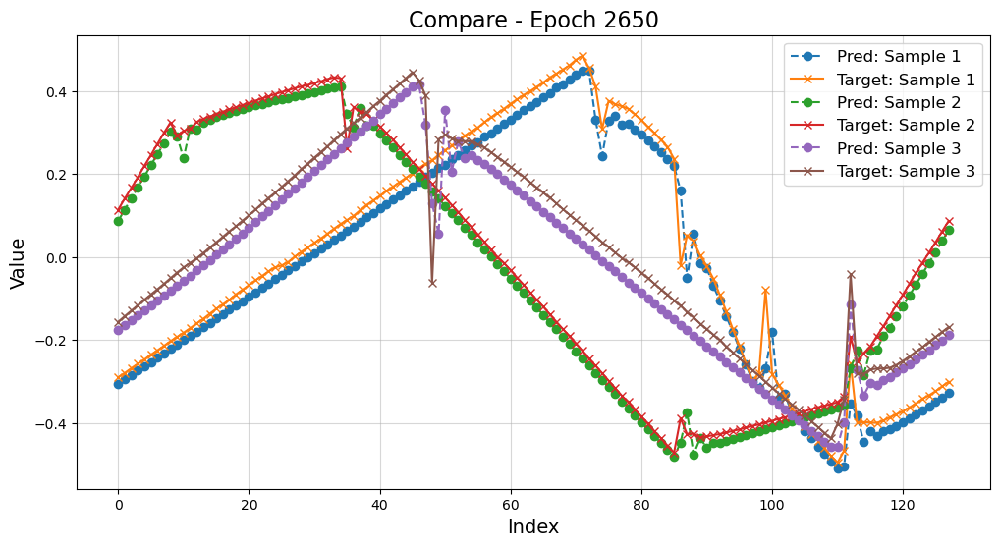

Epoch 2651, Train Loss: 0.004525, Validation Loss: 0.004320
Epoch 2652, Train Loss: 0.004554, Validation Loss: 0.004566
Epoch 2653, Train Loss: 0.004538, Validation Loss: 0.004322
Epoch 2654, Train Loss: 0.004571, Validation Loss: 0.004296
Epoch 2655, Train Loss: 0.004509, Validation Loss: 0.004316
Epoch 2656, Train Loss: 0.004564, Validation Loss: 0.004800
Epoch 2657, Train Loss: 0.004675, Validation Loss: 0.004420
Epoch 2658, Train Loss: 0.004556, Validation Loss: 0.004520
Epoch 2659, Train Loss: 0.004552, Validation Loss: 0.004521
Epoch 2660, Train Loss: 0.004574, Validation Loss: 0.004445
Epoch 2661, Train Loss: 0.004531, Validation Loss: 0.004473
Epoch 2662, Train Loss: 0.004490, Validation Loss: 0.004298
Epoch 2663, Train Loss: 0.004409, Validation Loss: 0.004416
Epoch 2664, Train Loss: 0.004578, Validation Loss: 0.004605
Epoch 2665, Train Loss: 0.004547, Validation Loss: 0.004765
Epoch 2666, Train Loss: 0.004655, Validation Loss: 0.004451
Epoch 2667, Train Loss: 0.004522, Valida

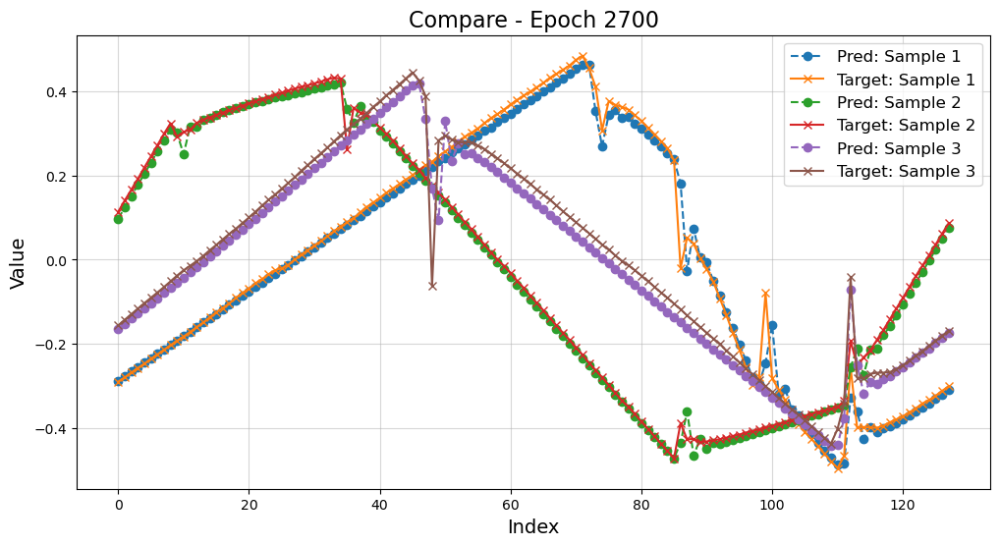

Epoch 2701, Train Loss: 0.004483, Validation Loss: 0.004390
Epoch 2702, Train Loss: 0.004581, Validation Loss: 0.004462
Epoch 2703, Train Loss: 0.004462, Validation Loss: 0.004464
Epoch 2704, Train Loss: 0.004548, Validation Loss: 0.004286
Epoch 2705, Train Loss: 0.004421, Validation Loss: 0.004397
Epoch 2706, Train Loss: 0.004512, Validation Loss: 0.004623
Epoch 2707, Train Loss: 0.004633, Validation Loss: 0.004558
Epoch 2708, Train Loss: 0.004455, Validation Loss: 0.004407
Epoch 2709, Train Loss: 0.004470, Validation Loss: 0.004318
Epoch 2710, Train Loss: 0.004426, Validation Loss: 0.004313
Epoch 2711, Train Loss: 0.004434, Validation Loss: 0.004399
Epoch 2712, Train Loss: 0.004513, Validation Loss: 0.004415
Epoch 2713, Train Loss: 0.004512, Validation Loss: 0.004555
Epoch 2714, Train Loss: 0.004575, Validation Loss: 0.004521
Epoch 2715, Train Loss: 0.004488, Validation Loss: 0.004287
Epoch 2716, Train Loss: 0.004510, Validation Loss: 0.004422
Epoch 2717, Train Loss: 0.004468, Valida

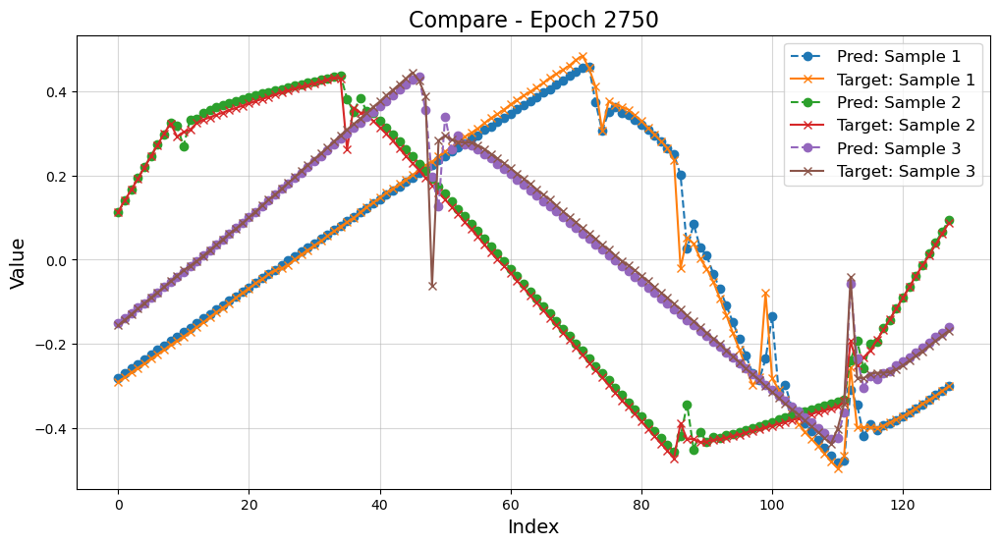

Epoch 2751, Train Loss: 0.004562, Validation Loss: 0.004394
Epoch 2752, Train Loss: 0.004389, Validation Loss: 0.004222
Saving model at epoch 2752 with validation loss 0.004222...
Epoch 2753, Train Loss: 0.004449, Validation Loss: 0.004819
Epoch 2754, Train Loss: 0.004532, Validation Loss: 0.004379
Epoch 2755, Train Loss: 0.004486, Validation Loss: 0.004473
Epoch 2756, Train Loss: 0.004560, Validation Loss: 0.004610
Epoch 2757, Train Loss: 0.004495, Validation Loss: 0.004318
Epoch 2758, Train Loss: 0.004473, Validation Loss: 0.004431
Epoch 2759, Train Loss: 0.004436, Validation Loss: 0.004555
Epoch 2760, Train Loss: 0.004491, Validation Loss: 0.004292
Epoch 2761, Train Loss: 0.004459, Validation Loss: 0.004502
Epoch 2762, Train Loss: 0.004635, Validation Loss: 0.004439
Epoch 2763, Train Loss: 0.004665, Validation Loss: 0.004342
Epoch 2764, Train Loss: 0.004449, Validation Loss: 0.004334
Epoch 2765, Train Loss: 0.004434, Validation Loss: 0.004454
Epoch 2766, Train Loss: 0.004487, Valida

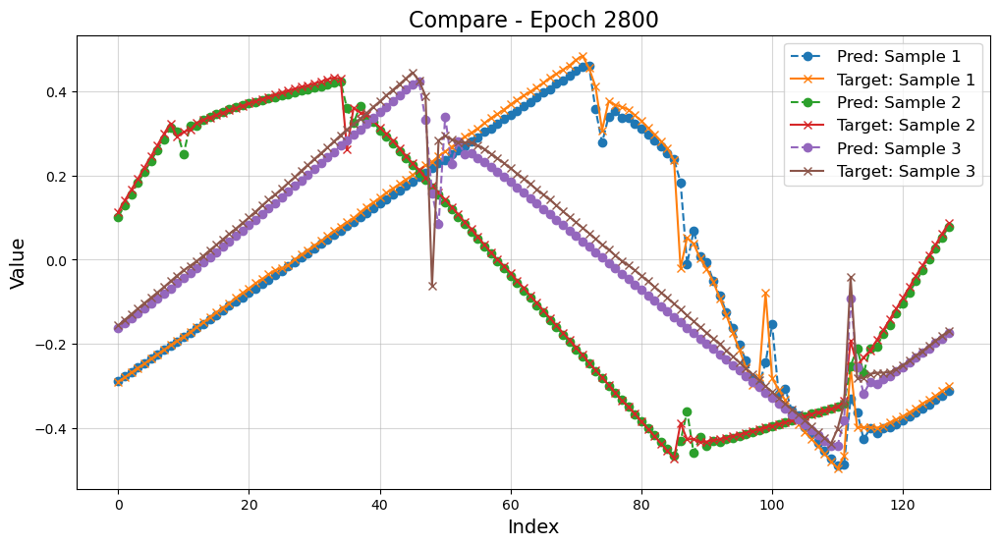

Epoch 2801, Train Loss: 0.004426, Validation Loss: 0.004393
Epoch 2802, Train Loss: 0.004419, Validation Loss: 0.004616
Epoch 2803, Train Loss: 0.004395, Validation Loss: 0.004284
Epoch 2804, Train Loss: 0.004584, Validation Loss: 0.004711
Epoch 2805, Train Loss: 0.004486, Validation Loss: 0.004334
Epoch 2806, Train Loss: 0.004466, Validation Loss: 0.004716
Epoch 2807, Train Loss: 0.004492, Validation Loss: 0.004345
Epoch 2808, Train Loss: 0.004409, Validation Loss: 0.004474
Epoch 2809, Train Loss: 0.004434, Validation Loss: 0.004248
Epoch 2810, Train Loss: 0.004529, Validation Loss: 0.004337
Epoch 2811, Train Loss: 0.004518, Validation Loss: 0.004452
Epoch 2812, Train Loss: 0.004426, Validation Loss: 0.004266
Epoch 2813, Train Loss: 0.004440, Validation Loss: 0.004369
Epoch 2814, Train Loss: 0.004421, Validation Loss: 0.004300
Epoch 2815, Train Loss: 0.004410, Validation Loss: 0.004362
Epoch 2816, Train Loss: 0.004463, Validation Loss: 0.004303
Epoch 2817, Train Loss: 0.004455, Valida

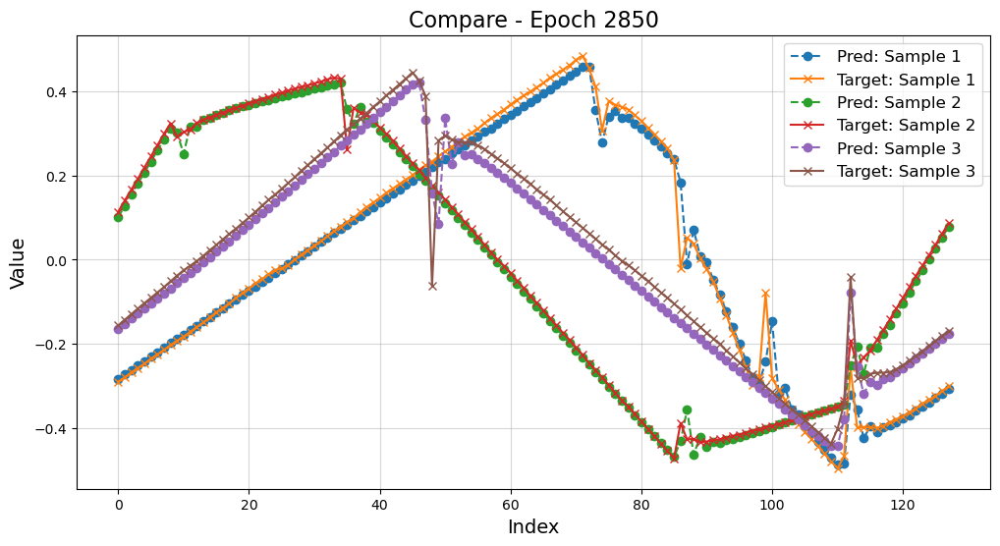

Epoch 2851, Train Loss: 0.004435, Validation Loss: 0.004340
Epoch 2852, Train Loss: 0.004408, Validation Loss: 0.004221
Epoch 2853, Train Loss: 0.004508, Validation Loss: 0.004376
Epoch 2854, Train Loss: 0.004450, Validation Loss: 0.004301
Epoch 2855, Train Loss: 0.004344, Validation Loss: 0.004209
Saving model at epoch 2855 with validation loss 0.004209...
Epoch 2856, Train Loss: 0.004382, Validation Loss: 0.004367
Epoch 2857, Train Loss: 0.004363, Validation Loss: 0.004232
Epoch 2858, Train Loss: 0.004475, Validation Loss: 0.004568
Epoch 2859, Train Loss: 0.004472, Validation Loss: 0.004364
Epoch 2860, Train Loss: 0.004480, Validation Loss: 0.004643
Epoch 2861, Train Loss: 0.004461, Validation Loss: 0.004348
Epoch 2862, Train Loss: 0.004447, Validation Loss: 0.004662
Epoch 2863, Train Loss: 0.004387, Validation Loss: 0.004231
Epoch 2864, Train Loss: 0.004357, Validation Loss: 0.004435
Epoch 2865, Train Loss: 0.004383, Validation Loss: 0.004157
Saving model at epoch 2865 with validati

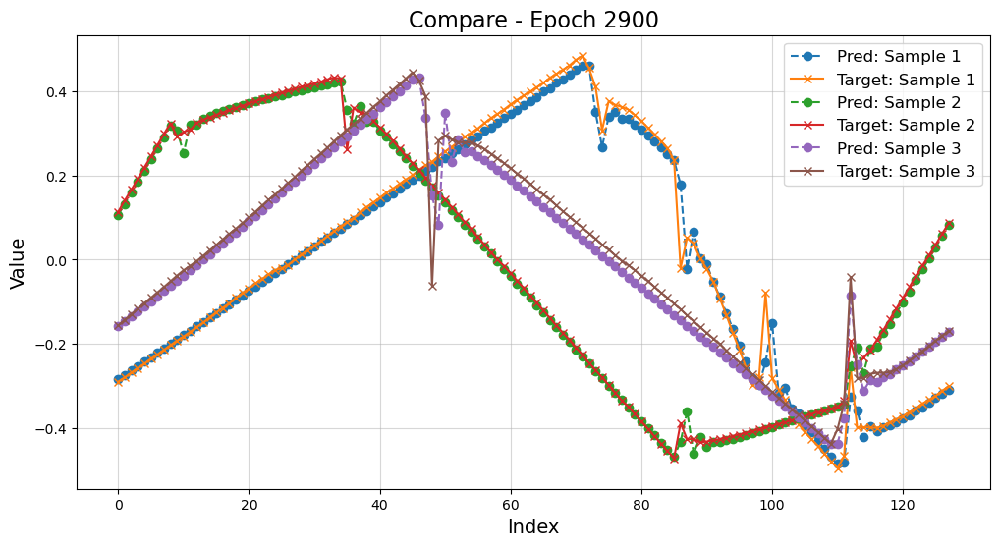

Epoch 2901, Train Loss: 0.004319, Validation Loss: 0.004295
Epoch 2902, Train Loss: 0.004549, Validation Loss: 0.004169
Epoch 2903, Train Loss: 0.004337, Validation Loss: 0.004260
Epoch 2904, Train Loss: 0.004401, Validation Loss: 0.004373
Epoch 2905, Train Loss: 0.004450, Validation Loss: 0.004821
Epoch 2906, Train Loss: 0.004524, Validation Loss: 0.004719
Epoch 2907, Train Loss: 0.004624, Validation Loss: 0.004366
Epoch 2908, Train Loss: 0.004389, Validation Loss: 0.004365
Epoch 2909, Train Loss: 0.004364, Validation Loss: 0.004365
Epoch 2910, Train Loss: 0.004367, Validation Loss: 0.004356
Epoch 2911, Train Loss: 0.004309, Validation Loss: 0.004345
Epoch 2912, Train Loss: 0.004353, Validation Loss: 0.004232
Epoch 2913, Train Loss: 0.004388, Validation Loss: 0.004391
Epoch 2914, Train Loss: 0.004461, Validation Loss: 0.004648
Epoch 2915, Train Loss: 0.004538, Validation Loss: 0.004886
Epoch 2916, Train Loss: 0.004481, Validation Loss: 0.004189
Epoch 2917, Train Loss: 0.004339, Valida

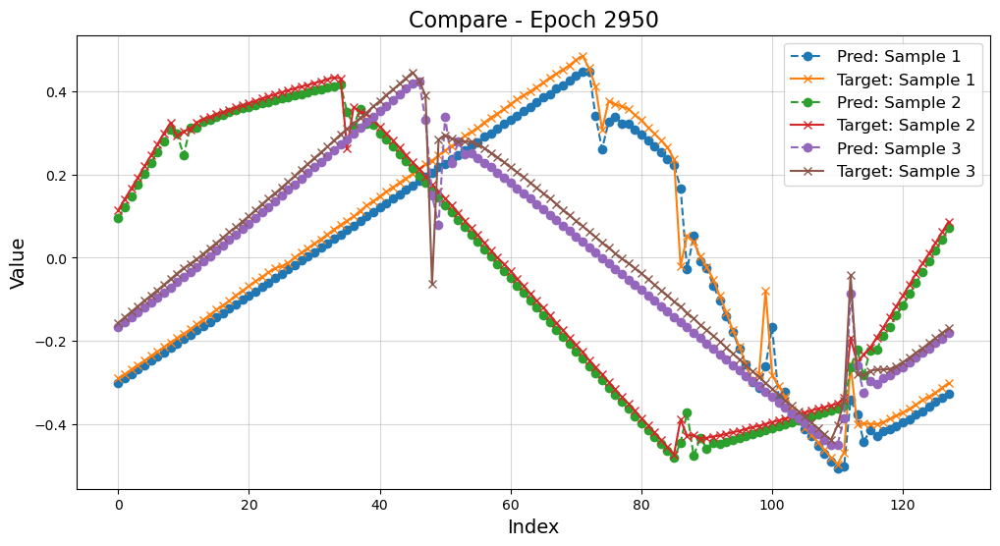

Epoch 2951, Train Loss: 0.004390, Validation Loss: 0.004367
Epoch 2952, Train Loss: 0.004444, Validation Loss: 0.005265
Epoch 2953, Train Loss: 0.004602, Validation Loss: 0.004431
Epoch 2954, Train Loss: 0.004323, Validation Loss: 0.004428
Epoch 2955, Train Loss: 0.004412, Validation Loss: 0.004251
Epoch 2956, Train Loss: 0.004487, Validation Loss: 0.004240
Epoch 2957, Train Loss: 0.004333, Validation Loss: 0.004214
Epoch 2958, Train Loss: 0.004372, Validation Loss: 0.004305
Epoch 2959, Train Loss: 0.004320, Validation Loss: 0.004267
Epoch 2960, Train Loss: 0.004341, Validation Loss: 0.004290
Epoch 2961, Train Loss: 0.004283, Validation Loss: 0.004238
Epoch 2962, Train Loss: 0.004324, Validation Loss: 0.004278
Epoch 2963, Train Loss: 0.004421, Validation Loss: 0.004690
Epoch 2964, Train Loss: 0.004448, Validation Loss: 0.004390
Epoch 2965, Train Loss: 0.004360, Validation Loss: 0.004407
Epoch 2966, Train Loss: 0.004373, Validation Loss: 0.004265
Epoch 2967, Train Loss: 0.004507, Valida

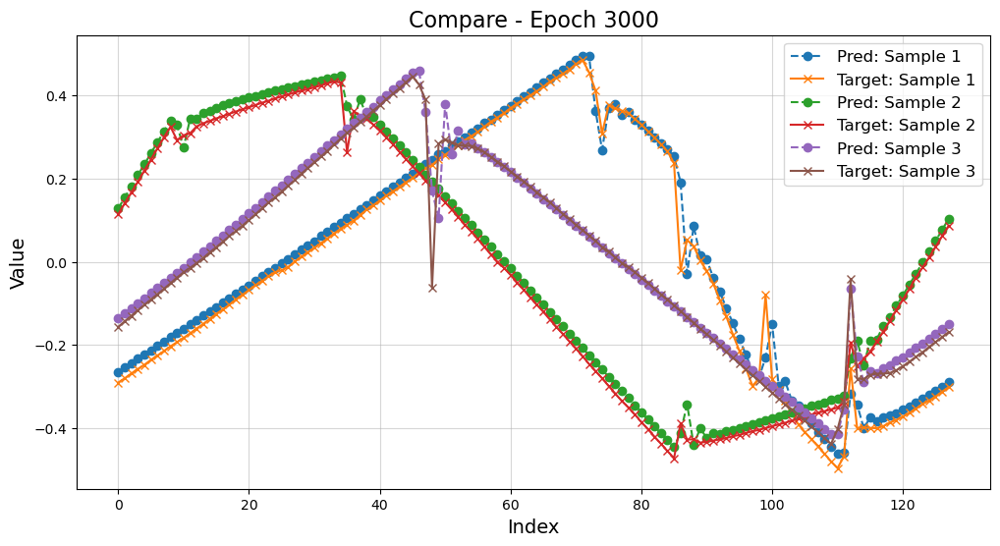

Training complete. Best model saved at ./Model/Material C.pt.


In [10]:
if __name__ == "__main__":

    data_B, data_F, data_T, data_H, data_Pcv = load_dataset(material)
    norm = normsDict[material]

    train_loader, valid_loader = get_dataloader(data_B, data_F, data_T, data_H,
                                                data_Pcv, norm)

    train_model(train_loader, valid_loader)